In [1]:
%cd ../
%matplotlib inline

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import htfa_torch.htfa as HTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

In [3]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [4]:
synthetic_db = niidb.FMriActivationsDb('data/synthetic_data.db',
                                       mask='data/synthetic_data/nifti_files/wholebrain.nii.gz')

In [5]:
htfa = HTFA.HierarchicalTopographicFactorAnalysis(list(synthetic_db.all()), mask='data/synthetic_data/nifti_files/wholebrain.nii.gz', num_factors=20)

01/09/2019 14:15:43 Loading Nifti image data/synthetic_data/nifti_files/subject_5_task_1.nii with mask data/synthetic_data/nifti_files/wholebrain.nii.gz (zscore=False, smooth=None)
01/09/2019 14:15:54 Loading Nifti image data/synthetic_data/nifti_files/subject_17_task_2.nii with mask data/synthetic_data/nifti_files/wholebrain.nii.gz (zscore=False, smooth=None)
01/09/2019 14:16:04 Loading Nifti image data/synthetic_data/nifti_files/subject_20_task_2.nii with mask data/synthetic_data/nifti_files/wholebrain.nii.gz (zscore=False, smooth=None)
01/09/2019 14:16:14 Loading Nifti image data/synthetic_data/nifti_files/subject_6_task_2.nii with mask data/synthetic_data/nifti_files/wholebrain.nii.gz (zscore=False, smooth=None)
01/09/2019 14:16:24 Loading Nifti image data/synthetic_data/nifti_files/subject_11_task_2.nii with mask data/synthetic_data/nifti_files/wholebrain.nii.gz (zscore=False, smooth=None)
01/09/2019 14:16:33 Loading Nifti image data/synthetic_data/nifti_files/subject_4_task_2.nii

In [6]:
htfa.normalize_activations()

[tensor(35.4537),
 tensor(38.3096),
 tensor(24.8574),
 tensor(70.0717),
 tensor(27.1458),
 tensor(37.7904),
 tensor(29.4101),
 tensor(32.3829),
 tensor(63.4551),
 tensor(11.4074),
 tensor(11.4074),
 tensor(39.0929),
 tensor(44.9267),
 tensor(24.8574),
 tensor(31.4188),
 tensor(22.0995),
 tensor(23.1583),
 tensor(44.6713),
 tensor(38.3096),
 tensor(37.5712),
 tensor(37.5712),
 tensor(32.3829),
 tensor(37.5947),
 tensor(22.0995),
 tensor(24.7497),
 tensor(63.4551),
 tensor(44.6713),
 tensor(27.1458),
 tensor(74.0087),
 tensor(70.0717),
 tensor(23.1583),
 tensor(31.4188),
 tensor(44.9267),
 tensor(35.4537),
 tensor(37.7904),
 tensor(24.7497),
 tensor(29.4101),
 tensor(37.5947),
 tensor(39.0929),
 tensor(74.0087),
 tensor(19.4622),
 tensor(19.4622),
 tensor(41.3775),
 tensor(29.6731),
 tensor(36.3397),
 tensor(25.8250),
 tensor(30.5526),
 tensor(36.3397),
 tensor(30.5526),
 tensor(29.6731),
 tensor(19.9918),
 tensor(34.1081),
 tensor(42.3914),
 tensor(41.3775),
 tensor(28.5821),
 tensor(42

In [7]:
def training_set_filter(block):
    # Our training set consists of subjects 1-20.  21-30 are the validation set.
    return block.subject <= 20

In [8]:
losses = htfa.train(num_steps=1000, learning_rate=1e-1, log_level=logging.INFO, num_particles=1,
                    batch_size=300, use_cuda=True, blocks_batch_size=9, checkpoint_steps=200)

01/09/2019 14:22:35 [Epoch 1] (20377ms) Posterior free-energy 8.04755456e+10
01/09/2019 14:22:35 Saving checkpoint...
01/09/2019 14:22:55 [Epoch 2] (20335ms) Posterior free-energy 7.11362642e+10
01/09/2019 14:23:16 [Epoch 3] (20448ms) Posterior free-energy 6.27049103e+10
01/09/2019 14:23:36 [Epoch 4] (20539ms) Posterior free-energy 5.90210744e+10
01/09/2019 14:23:57 [Epoch 5] (20444ms) Posterior free-energy 5.65601116e+10
01/09/2019 14:24:17 [Epoch 6] (20409ms) Posterior free-energy 5.37109422e+10
01/09/2019 14:24:38 [Epoch 7] (20436ms) Posterior free-energy 5.18432113e+10
01/09/2019 14:24:58 [Epoch 8] (20416ms) Posterior free-energy 5.18855434e+10
01/09/2019 14:25:18 [Epoch 9] (20474ms) Posterior free-energy 5.07954668e+10
01/09/2019 14:25:39 [Epoch 10] (20508ms) Posterior free-energy 5.05808650e+10
01/09/2019 14:25:59 [Epoch 11] (20448ms) Posterior free-energy 4.99714826e+10
01/09/2019 14:26:20 [Epoch 12] (20475ms) Posterior free-energy 5.20619950e+10
01/09/2019 14:26:40 [Epoch 13] (

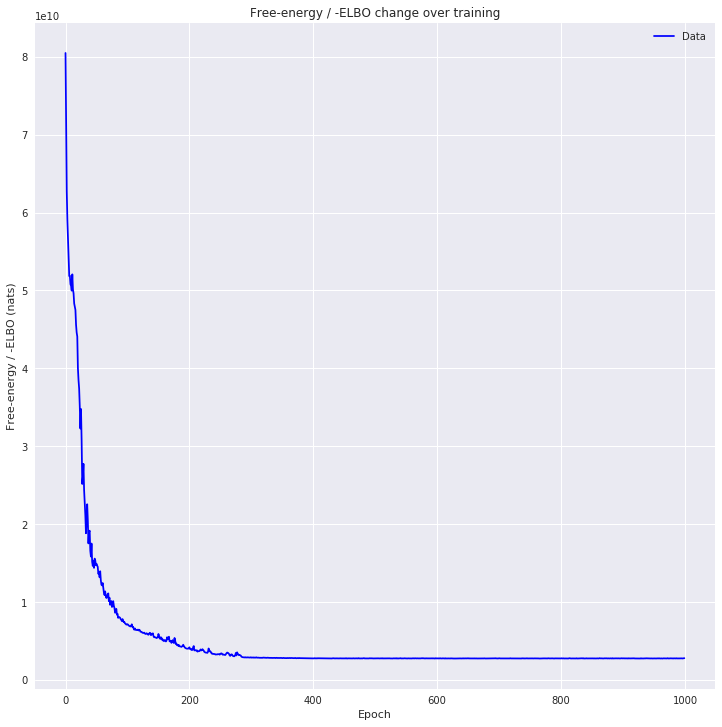

In [9]:
utils.plot_losses(losses)

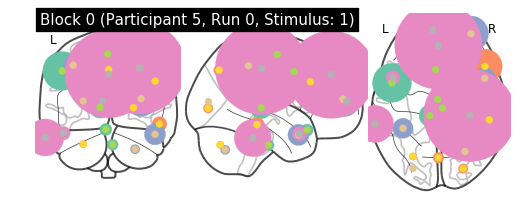

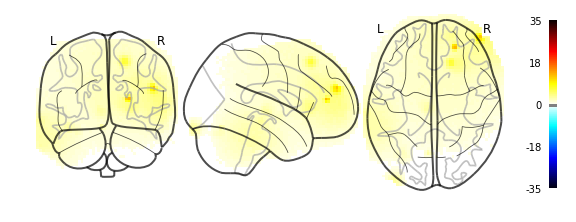

01/09/2019 20:02:54 Reconstruction Error (Frobenius Norm): 1.33284534e+03 out of 9.17171484e+03


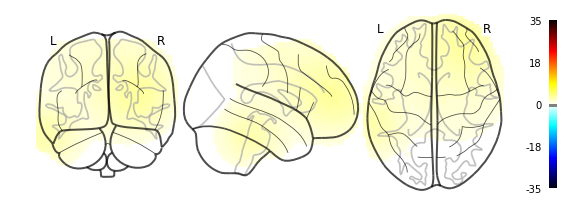

{'factors': tensor([[2.5944e-05, 2.7266e-05, 2.7573e-05,  ..., 5.3093e-09, 7.5930e-09,
         5.3114e-09],
        [2.5084e-32, 1.1265e-32, 4.4711e-33,  ..., 3.7974e-29, 4.5814e-29,
         2.8009e-28],
        [2.1015e-31, 3.5245e-32, 5.0824e-33,  ..., 1.0792e-22, 6.0597e-23,
         1.6144e-22],
        ...,
        [1.1386e-01, 1.1738e-01, 1.2074e-01,  ..., 1.1789e-01, 1.2385e-01,
         1.2493e-01],
        [7.9843e-16, 9.0697e-16, 9.9438e-16,  ..., 1.6522e-15, 2.4929e-15,
         4.8017e-15],
        [4.9623e-01, 4.3928e-01, 3.8380e-01,  ..., 1.2963e-07, 1.2745e-07,
         1.2479e-07]]), 'factor_centers': tensor([[ -8.6727, -28.4689,   2.3725],
        [ -2.6421,  20.0275, -20.9406],
        [  4.5898, -20.5008, -36.9654],
        [ -0.4930, -11.3561,  58.4346],
        [-48.5163,   6.1024,  40.5833],
        [ 53.8201, -32.7754, -15.2138],
        [-26.3359, -71.3790, -36.4624],
        [ 49.2728,  23.3988,  29.8726],
        [ 26.4354, -84.1040,   1.9067],
        [  0.

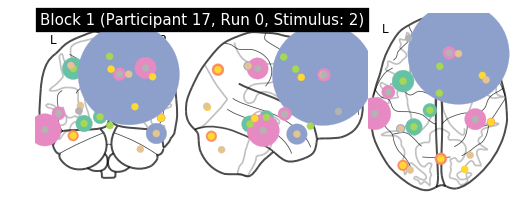

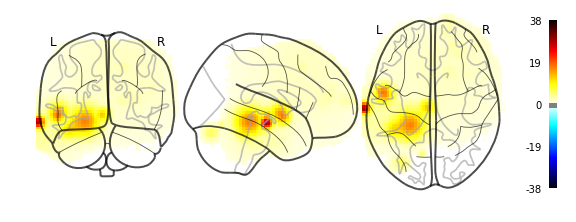

01/09/2019 20:03:22 Reconstruction Error (Frobenius Norm): 2.72149194e+03 out of 9.89690527e+03


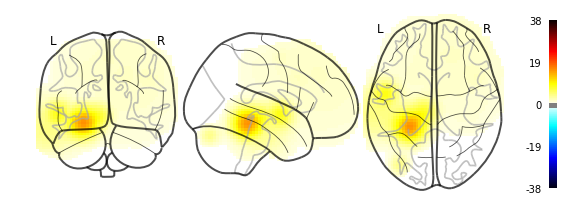

{'factors': tensor([[1.6222e-12, 1.3396e-12, 1.0073e-12,  ..., 7.0430e-20, 1.2311e-19,
         8.4032e-20],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.6104e-05, 4.2129e-05, 2.9642e-05,  ..., 6.1014e-19, 7.7138e-19,
         4.7329e-19],
        ...,
        [2.8026e-45, 8.4078e-45, 3.2230e-44,  ..., 3.4271e-36, 3.3281e-35,
         3.7914e-35],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7729e-01, 3.3662e-01, 2.9520e-01,  ..., 8.2288e-10, 8.4253e-10,
         8.3368e-10]]), 'factor_centers': tensor([[ -8.6753, -22.8481,  -7.6257],
        [  1.7382,  23.4218, -16.7598],
        [-25.4794, -40.2017, -14.6970],
        [  1.3616,  -4.6969,  55.9115],
        [-36.8663,   7.8624,  43.1839],
        [ 55.5619, -35.1560,  -8.7682],
        [-36.9777, -80.7347, -27.4537],
        [ 46.5645,  13.8580,  34.5224],
        [ 27.9750, -84.8930,   3.0063],
        [  2.

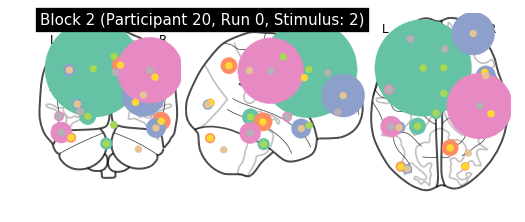

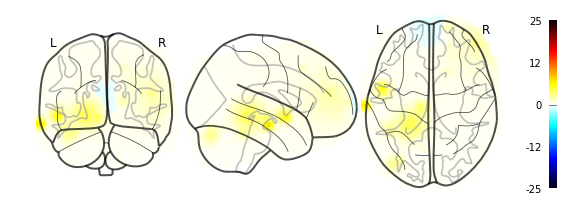

01/09/2019 20:03:50 Reconstruction Error (Frobenius Norm): 1.41423682e+03 out of 5.72345361e+03


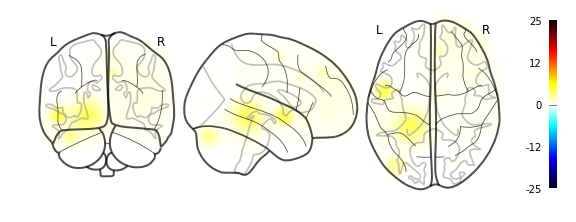

{'factors': tensor([[2.2752e-05, 2.0123e-05, 1.6689e-05,  ..., 7.1518e-18, 1.0589e-17,
         5.6465e-18],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5543e-22, 3.5728e-23, 7.2220e-24,  ..., 1.9027e-22, 1.2236e-22,
         2.1418e-22],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.4403e-02, 4.7472e-02, 3.3605e-02,  ..., 1.9890e-17, 2.0258e-17,
         1.7048e-17]]), 'factor_centers': tensor([[-21.7252, -39.5089,  -7.2184],
        [  5.7942,  22.0093, -16.1262],
        [ -2.0962, -25.7384, -35.7988],
        [  6.0118,  -5.0747,  55.8654],
        [-15.7238,  21.7572,  42.8220],
        [ 55.6402, -26.4559, -12.3074],
        [-39.2380, -82.0666, -29.4555],
        [ 49.0744,  17.1272,  34.1816],
        [ 28.5235, -81.8048,   7.5479],
        [ 12.

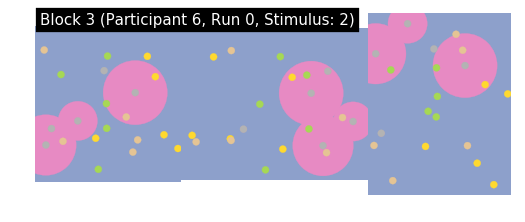

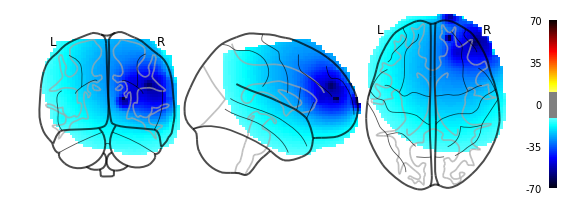

01/09/2019 20:04:17 Reconstruction Error (Frobenius Norm): 1.38391250e+04 out of 8.74800078e+04


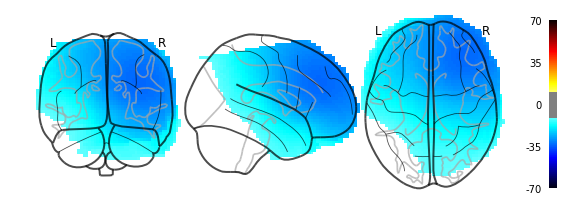

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.8836e-05, 5.9255e-05, 3.8749e-05,  ..., 2.3298e-05, 1.8208e-05,
         2.4026e-05],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.8427e-05, 2.7294e-05, 2.5903e-05,  ..., 4.1420e-07, 4.3659e-07,
         6.0347e-07],
        [3.5837e-07, 1.6582e-08, 4.6610e-10,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  -1.9724,  -29.7788,    6.2643],
        [  -1.6999,   21.8754,  -19.7819],
        [ -10.5021,  -23.8393,  -62.8423],
        [  -0.7964,   -8.1917,   56.2631],
        [ -49.7558,   19.6748,   36.8171],
        [  73.2466,   -5.5428,  -40.9816],
        [ -13.2635,  -60.7987,  -30.1949],
        [  49.4832,    4.2427,   34.5729],
        [  58.5998, -101.0096

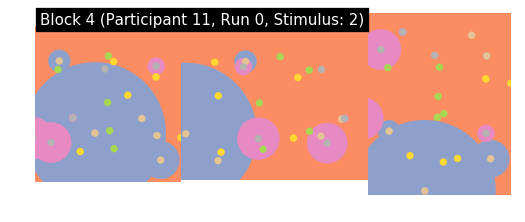

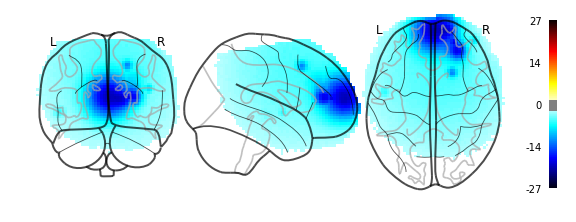

01/09/2019 20:04:44 Reconstruction Error (Frobenius Norm): 6.61492871e+03 out of 1.66890977e+04


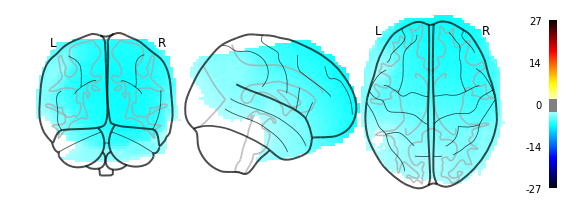

{'factors': tensor([[8.8720e-31, 1.6369e-30, 2.4595e-30,  ..., 1.0597e-39, 1.0118e-38,
         9.4347e-40],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.8873e-39, 3.4002e-40, 2.4730e-41,  ..., 1.1138e-26, 4.2605e-27,
         1.2748e-26],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.2666e-01, 4.7837e-01, 4.3013e-01,  ..., 4.9054e-07, 4.8313e-07,
         4.8596e-07]]), 'factor_centers': tensor([[  -0.7030,  -30.1958,    7.4437],
        [   1.4259,   22.4911,  -22.2293],
        [   6.0412,  -26.3048,  -41.1316],
        [   0.1419,   -8.3254,   56.2783],
        [ -52.9418,   22.1065,   42.0598],
        [  76.4768,    5.6458,  -29.4286],
        [ -29.5631,  -70.5335,  -44.1627],
        [  50.2095,   10.1880,   34.2977],
        [  20.4534,  -73.4416

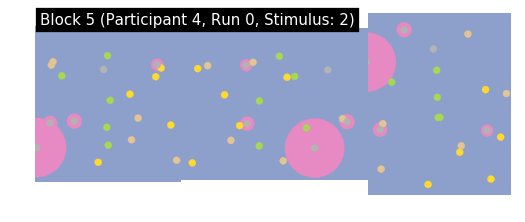

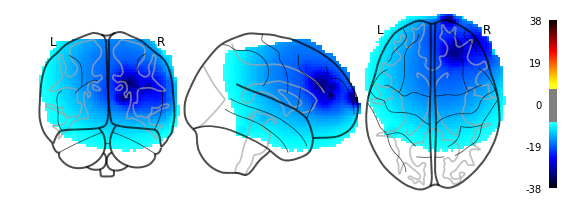

01/09/2019 20:05:12 Reconstruction Error (Frobenius Norm): 1.01772939e+04 out of 5.27152031e+04


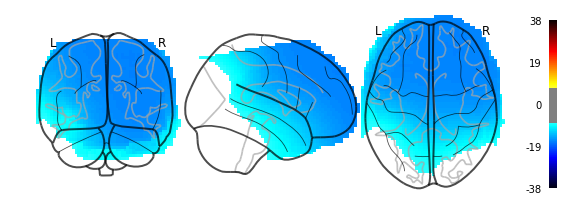

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0739e-43, 1.1210e-44, 0.0000e+00,  ..., 4.1639e-40, 1.5558e-40,
         3.5737e-40],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.3262e-29, 6.9879e-29, 4.8299e-29,  ..., 3.6434e-44, 5.3249e-44,
         4.2319e-43],
        [1.5049e-01, 1.0293e-01, 6.4388e-02,  ..., 5.6052e-45, 8.4078e-45,
         4.2039e-45]]), 'factor_centers': tensor([[ 1.9732e+00, -3.0157e+01,  9.7055e+00],
        [-1.5845e+00,  1.9325e+01, -1.8693e+01],
        [-4.2462e-02, -3.0376e+01, -3.7588e+01],
        [-8.4374e-01, -9.2035e+00,  5.6627e+01],
        [-4.8878e+01,  6.8404e+00,  3.5438e+01],
        [ 6.5767e+01, -5.1039e+01, -1.6277e+01],
        [-1.0600e+01, -1.0083e+02, -5.5479e+01],
        [ 4.9918e+01, -1.0829e

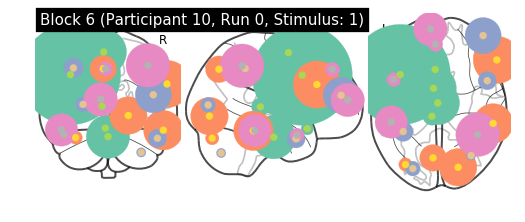

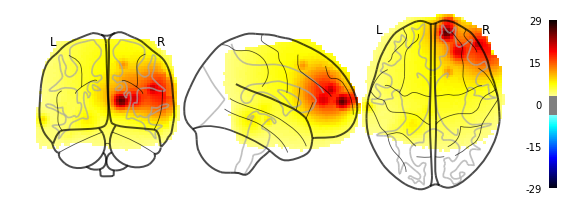

01/09/2019 20:05:39 Reconstruction Error (Frobenius Norm): 2.94950415e+03 out of 2.42519043e+04


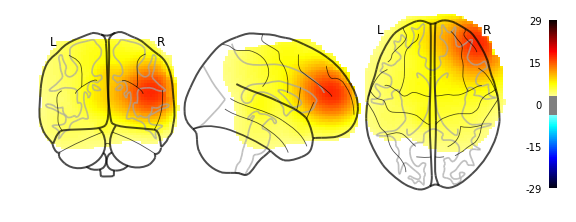

{'factors': tensor([[6.9401e-08, 7.6296e-08, 7.9224e-08,  ..., 1.4312e-12, 2.4837e-12,
         1.4143e-12],
        [2.4246e-30, 1.2011e-30, 5.2932e-31,  ..., 5.8297e-28, 7.3618e-28,
         3.8815e-27],
        [1.8441e-02, 1.6922e-02, 1.5380e-02,  ..., 2.6446e-02, 2.6196e-02,
         2.7599e-02],
        ...,
        [8.5426e-37, 3.1667e-36, 1.0742e-35,  ..., 9.9642e-39, 7.5129e-38,
         9.1873e-38],
        [1.5817e-07, 1.6888e-07, 1.7744e-07,  ..., 1.1366e-07, 1.3796e-07,
         1.8501e-07],
        [3.0454e-01, 2.7188e-01, 2.3861e-01,  ..., 9.6838e-08, 9.9102e-08,
         9.3260e-08]]), 'factor_centers': tensor([[ -6.5964, -29.1249,   3.4799],
        [ -3.1514,  20.1222, -19.5153],
        [ -0.3155, -15.1110, -28.4686],
        [ -4.8792,   0.3561,  60.4879],
        [-39.7869,  14.7920,  36.7684],
        [ 57.8806, -36.5677, -21.7474],
        [-34.3471, -79.8727, -29.5124],
        [ 61.7629,  30.2006,  26.9302],
        [ 21.0276, -82.7688,  -6.2758],
        [ -5.

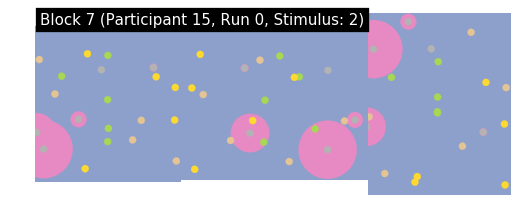

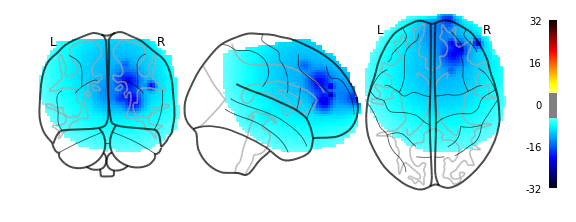

01/09/2019 20:06:08 Reconstruction Error (Frobenius Norm): 5.63808936e+03 out of 3.18530137e+04


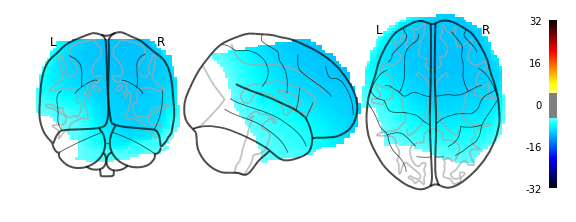

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.2671e-29, 1.0266e-29, 7.7411e-30,  ..., 1.7894e-40, 2.5736e-40,
         1.9035e-39],
        [6.8313e-01, 6.2341e-01, 5.6204e-01,  ..., 6.4420e-08, 6.4781e-08,
         6.1470e-08]]), 'factor_centers': tensor([[  -0.7350,  -24.3465,   10.4079],
        [   0.1016,   28.3267,  -19.8262],
        [  -0.6317,  -25.5442,  -33.7230],
        [  -0.5132,   -8.8220,   56.9587],
        [ -49.0654,   11.8499,   35.0500],
        [  69.7904,  -37.2488,  -11.0332],
        [ -24.3480,  -98.3116,  -62.2235],
        [  50.3395,    6.5689,   34.4946],
        [  70.4526, -101.3281

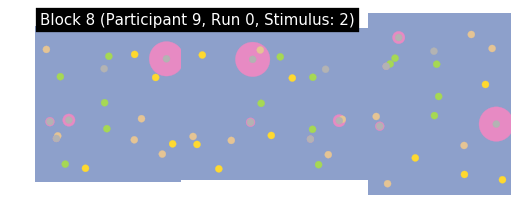

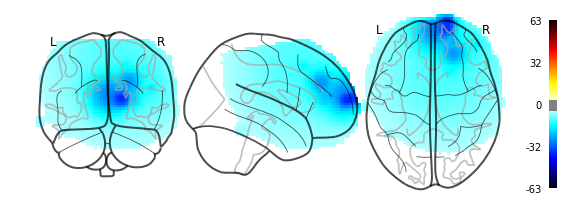

01/09/2019 20:06:36 Reconstruction Error (Frobenius Norm): 9.04496777e+03 out of 3.23427539e+04


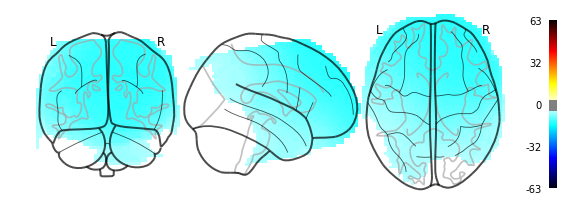

{'factors': tensor([[1.3250e-16, 1.8522e-16, 2.3055e-16,  ..., 3.5462e-24, 1.2543e-23,
         3.5625e-24],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0546e-02, 1.8198e-02, 1.6014e-02,  ..., 5.5451e-04, 5.1741e-04,
         6.3240e-04],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.4950e-35, 3.7814e-35, 2.3155e-35,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.6104e-03, 2.3991e-03, 8.1795e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  -3.8912,  -28.3811,    7.1601],
        [  -1.5063,   25.6887,  -20.1746],
        [ -45.2998,   32.0584,  -57.4051],
        [   0.5900,   -8.2740,   56.0350],
        [ -50.4278,   26.0079,   34.5705],
        [  82.9702,  -17.7129,  -26.6426],
        [ -24.0194,  -72.9031,  -61.7844],
        [  49.8219,    4.3742,   33.7580],
        [  67.6887,  -95.8547

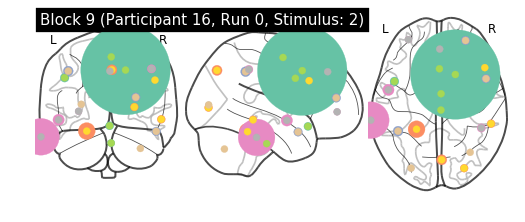

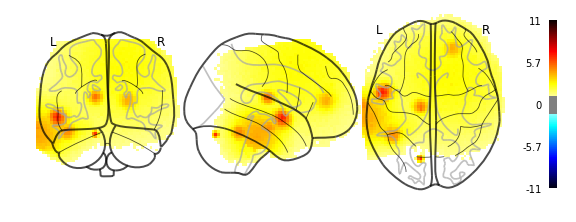

01/09/2019 20:07:04 Reconstruction Error (Frobenius Norm): 1.44391333e+03 out of 4.98697217e+03


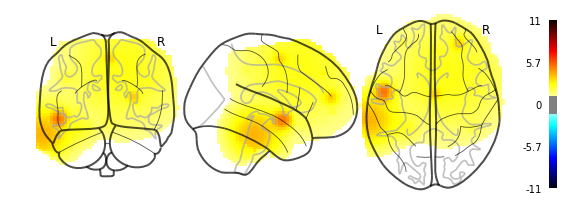

{'factors': tensor([[1.5385e-01, 1.5889e-01, 1.6373e-01,  ..., 2.6405e-01, 2.7765e-01,
         2.7277e-01],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.7833e-01, 4.2379e-01, 3.7048e-01,  ..., 3.6271e-08, 3.5762e-08,
         3.5519e-08]]), 'factor_centers': tensor([[ 18.1170,  14.8519,  41.5574],
        [  1.3688,  20.8779, -17.0875],
        [  2.9684, -22.5445, -35.2618],
        [  3.0989,  -5.3682,  55.3937],
        [-45.9429,   7.6083,  33.4917],
        [ 55.7280, -36.8877, -10.2358],
        [-22.6886, -42.7134, -22.6493],
        [ 49.0913,  22.0698,  30.9793],
        [ 27.4016, -83.7257,   2.6693],
        [  3.

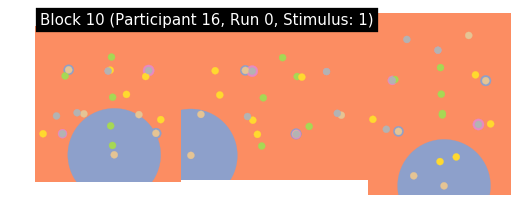

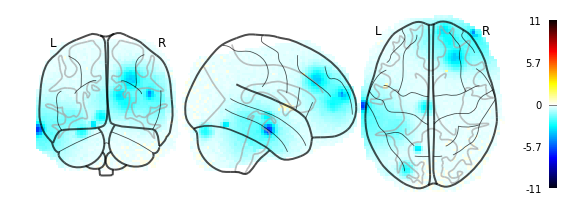

01/09/2019 20:07:32 Reconstruction Error (Frobenius Norm): 1.83188110e+03 out of 5.07640527e+03


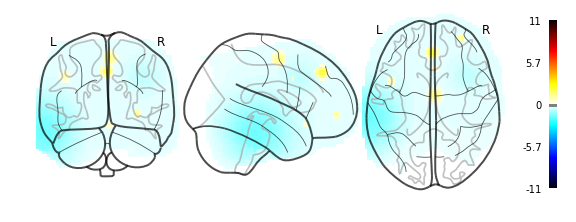

{'factors': tensor([[6.4855e-20, 1.1042e-19, 1.6835e-19,  ..., 1.3189e-20, 5.4353e-20,
         1.4384e-20],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [8.8436e-30, 1.4536e-30, 2.0578e-31,  ..., 2.7225e-22, 1.4789e-22,
         2.8244e-22],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.6239e-11, 5.7281e-12, 5.2224e-13,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[   4.5362,  -26.1460,   12.9508],
        [   2.4983,   22.1335,  -17.1672],
        [   4.4425,  -27.7626,  -37.7515],
        [   3.3767,   -5.8117,   55.2225],
        [ -45.4632,    9.5168,   35.3484],
        [  55.2096,  -37.1248,  -10.5950],
        [ -68.6160,  -32.3021,  -25.4778],
        [  39.3172,   14.4643,   34.7602],
        [  19.1065,  -71.8757

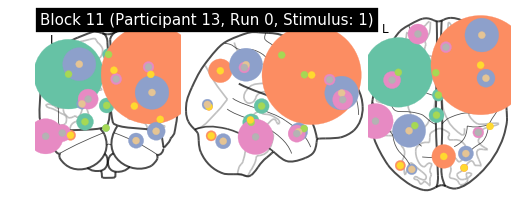

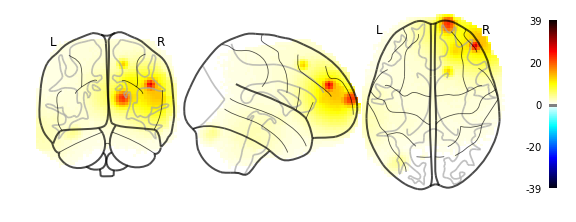

01/09/2019 20:07:59 Reconstruction Error (Frobenius Norm): 2.71381177e+03 out of 1.32955850e+04


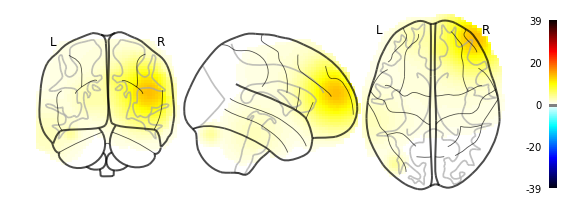

{'factors': tensor([[3.2855e-12, 3.8325e-12, 4.1273e-12,  ..., 8.2813e-16, 1.8304e-15,
         8.4143e-16],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.6282e-05, 4.4326e-05, 3.2774e-05,  ..., 4.1492e-18, 5.4139e-18,
         3.3348e-18],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1296e-16, 1.3597e-16, 1.5655e-16,  ..., 1.0416e-21, 1.7903e-21,
         3.7282e-21],
        [4.4867e-01, 3.9459e-01, 3.4204e-01,  ..., 2.8903e-08, 2.8539e-08,
         2.8121e-08]]), 'factor_centers': tensor([[ -1.7130, -27.9021,   4.2823],
        [ -2.4418,  16.7193, -19.4175],
        [-24.5302, -38.8880, -12.8526],
        [  0.2717,  -6.7498,  57.9377],
        [-41.8401,  17.1349,  37.2339],
        [ 54.6456, -39.6665, -10.3064],
        [-39.7942, -80.9327, -27.0230],
        [ 44.6778,  24.7348,  36.9864],
        [ 27.4146, -83.3563,   3.6628],
        [  5.

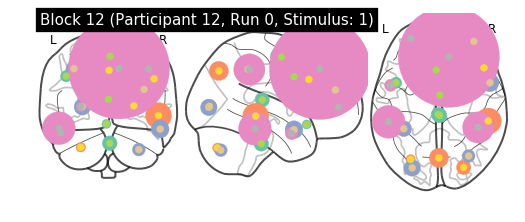

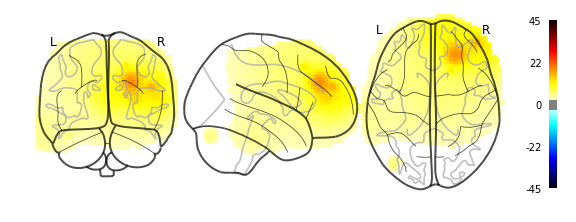

01/09/2019 20:08:27 Reconstruction Error (Frobenius Norm): 2.47032446e+03 out of 2.55877266e+04


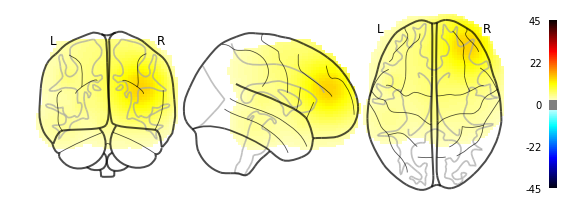

{'factors': tensor([[1.4021e-14, 2.0217e-14, 2.6648e-14,  ..., 5.2838e-18, 1.5623e-17,
         5.4999e-18],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5136e-15, 5.9351e-16, 2.1423e-16,  ..., 1.6743e-13, 1.2729e-13,
         1.6891e-13],
        ...,
        [1.9485e-01, 2.0004e-01, 2.0501e-01,  ..., 2.5836e-01, 2.6901e-01,
         2.6793e-01],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7644e-01, 3.4057e-01, 3.0305e-01,  ..., 7.5504e-08, 7.8009e-08,
         7.2868e-08]]), 'factor_centers': tensor([[  0.0963, -27.1612,  10.7313],
        [ -1.9565,  19.5333, -15.0719],
        [  1.4780, -28.1795, -35.4360],
        [  1.9107,  -6.9024,  55.9094],
        [-44.3111,   6.1499,  35.0954],
        [ 52.8385, -34.0959,  -6.3754],
        [-28.9126, -74.3650, -39.6806],
        [ 48.2415,  21.8709,  32.2863],
        [ 26.8627, -82.8754,   3.9015],
        [  0.

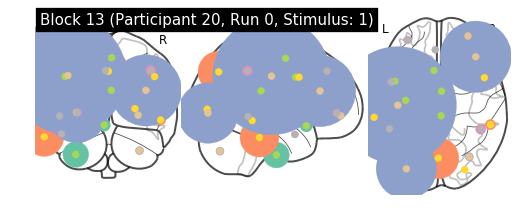

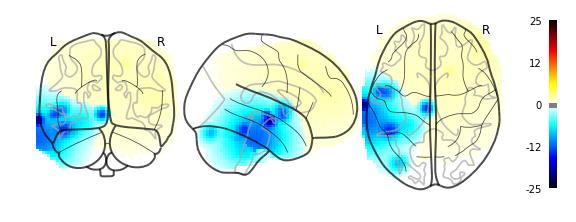

01/09/2019 20:08:54 Reconstruction Error (Frobenius Norm): 3.15722070e+03 out of 1.17473574e+04


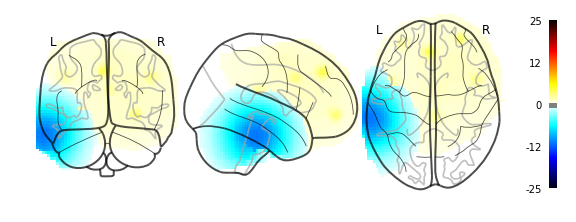

{'factors': tensor([[0.0000e+00, 0.0000e+00, 2.8026e-45,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.5524e-29, 3.1177e-29, 1.5584e-29,  ..., 3.1781e-28, 4.5185e-28,
         2.0076e-27],
        [4.5389e-04, 3.0038e-04, 1.9348e-04,  ..., 7.2002e-10, 5.9174e-10,
         8.3331e-10],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6974e-11, 5.1418e-12, 7.8924e-13,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  3.1503, -28.4745,  20.2853],
        [ -4.3750,  19.1125, -16.4099],
        [-34.2131, -12.3087, -47.2426],
        [  3.5178,  -2.7410,  54.4582],
        [-45.4932,   7.8549,  34.7040],
        [ 55.0252, -37.8416, -10.9668],
        [-67.3353, -30.1782, -28.8095],
        [ 48.6760,  11.5374,  34.6681],
        [ 28.0327, -85.1842,   0.9473],
        [  0.

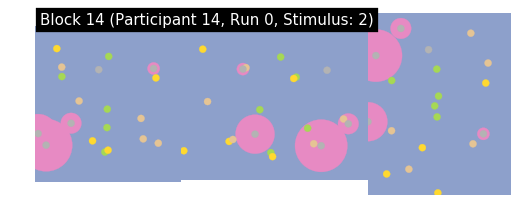

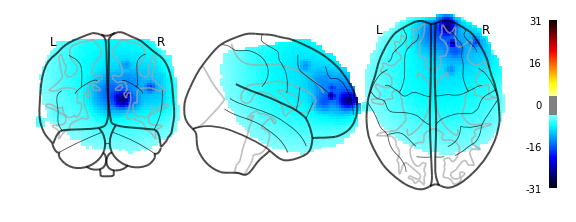

01/09/2019 20:09:22 Reconstruction Error (Frobenius Norm): 7.19749658e+03 out of 3.13113809e+04


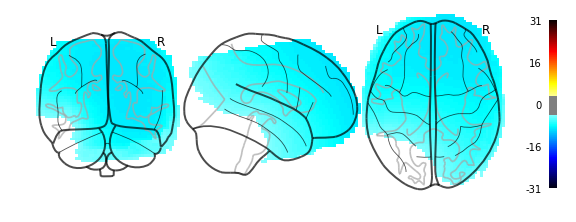

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.7178e-38, 1.5989e-39, 7.7259e-41,  ..., 7.5604e-37, 2.1463e-37,
         1.4870e-36],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.9545e-15, 1.6308e-15, 1.3047e-15,  ..., 2.0979e-24, 2.4515e-24,
         7.6095e-24],
        [6.0673e-01, 5.5244e-01, 4.9710e-01,  ..., 1.4247e-07, 1.4259e-07,
         1.3898e-07]]), 'factor_centers': tensor([[  -1.0674,  -29.7775,    0.4669],
        [  -1.3680,   20.5289,  -18.9790],
        [  -3.5982,  -18.1854,  -44.7021],
        [   0.4293,   -7.8563,   55.8614],
        [ -48.8389,    8.5062,   34.6872],
        [  84.0663,  -16.3647,  -48.9318],
        [ -16.5983,  -62.1185,  -32.9388],
        [  50.1255,    5.8851,   33.2758],
        [  -0.2686, -109.7291

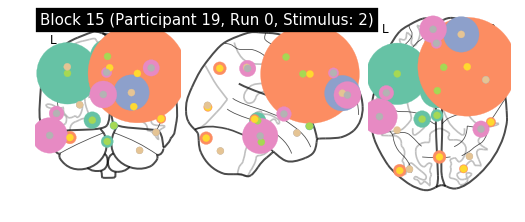

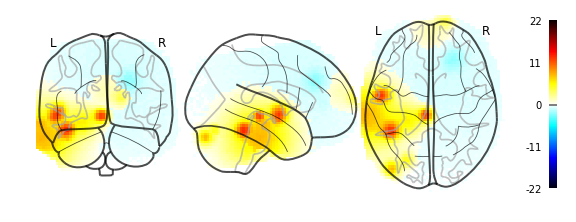

01/09/2019 20:09:50 Reconstruction Error (Frobenius Norm): 2.18744678e+03 out of 1.09825098e+04


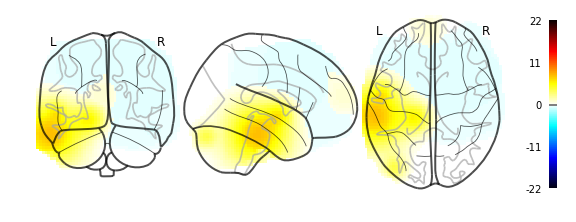

{'factors': tensor([[1.3439e-06, 1.0938e-06, 8.3505e-07,  ..., 7.0936e-16, 9.6257e-16,
         6.5730e-16],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0929e-21, 5.5495e-22, 1.2998e-22,  ..., 4.5623e-21, 3.2627e-21,
         4.6271e-21],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.7767e-11, 2.0492e-11, 2.3060e-11,  ..., 2.4856e-11, 3.4921e-11,
         5.2469e-11],
        [3.7789e-01, 3.3447e-01, 2.9185e-01,  ..., 9.9536e-08, 9.8739e-08,
         9.9113e-08]]), 'factor_centers': tensor([[-16.8311, -32.0786, -11.1698],
        [  5.8595,  22.4630, -16.8192],
        [ -1.1620, -28.1580, -33.6099],
        [ -0.7980,  -2.1673,  55.9020],
        [-42.9478,  15.5646,  38.1373],
        [ 55.5191, -35.2546,  -9.5683],
        [-40.3712, -86.2100, -29.4264],
        [ 30.6308,  22.9915,  37.9776],
        [ 26.7912, -84.3735,   3.0593],
        [  1.

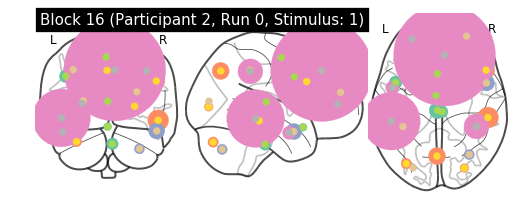

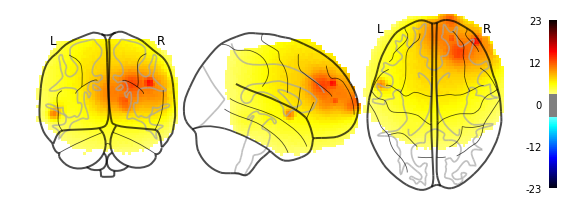

01/09/2019 20:10:18 Reconstruction Error (Frobenius Norm): 1.91981531e+03 out of 2.29464297e+04


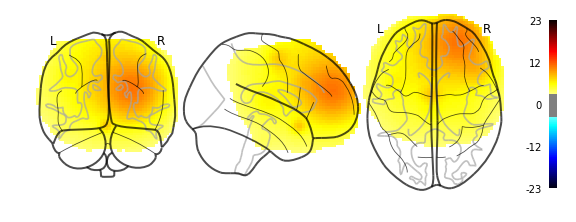

{'factors': tensor([[5.9141e-11, 7.4107e-11, 8.6951e-11,  ..., 1.9843e-13, 4.2075e-13,
         2.2424e-13],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.2767e-26, 5.0074e-27, 9.6563e-28,  ..., 8.9441e-20, 5.6317e-20,
         1.0733e-19],
        ...,
        [2.1086e-01, 2.1619e-01, 2.2128e-01,  ..., 2.4701e-01, 2.5681e-01,
         2.5631e-01],
        [2.9295e-11, 3.1987e-11, 3.3769e-11,  ..., 1.0996e-16, 1.5715e-16,
         2.7171e-16],
        [7.4513e-01, 7.3537e-01, 7.2183e-01,  ..., 5.5595e-03, 5.7290e-03,
         5.5024e-03]]), 'factor_centers': tensor([[ -0.7048, -22.9218,   8.7922],
        [ -0.7026,  15.6983, -17.9979],
        [  4.2482, -24.3405, -36.0551],
        [ -2.3376,  -7.2419,  55.2736],
        [-44.6803,   6.4856,  35.0761],
        [ 52.4749, -30.3755, -11.2945],
        [-33.4336, -78.9104, -33.7066],
        [ 50.5050,  19.4800,  30.0068],
        [ 27.6357, -83.5776,   3.4826],
        [ -1.

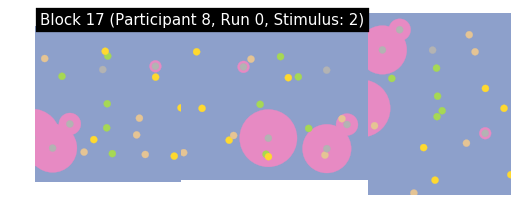

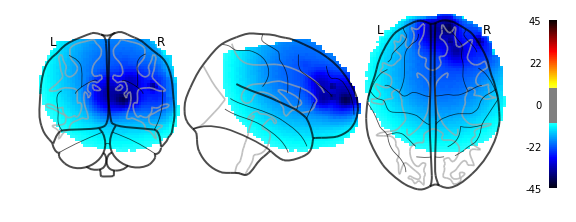

01/09/2019 20:10:47 Reconstruction Error (Frobenius Norm): 1.31475020e+04 out of 7.21408438e+04


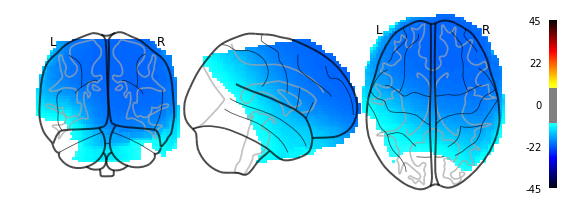

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8283e-19, 4.9783e-20, 1.2427e-20,  ..., 5.6673e-14, 3.0945e-14,
         6.5956e-14],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0707e-13, 1.7475e-13, 1.4207e-13,  ..., 9.9556e-22, 1.1322e-21,
         3.0641e-21],
        [6.0762e-01, 5.7747e-01, 5.4583e-01,  ..., 3.5575e-04, 3.5319e-04,
         3.6076e-04]]), 'factor_centers': tensor([[  -1.1199,  -29.4805,    6.0751],
        [  -1.6566,   21.5964,  -19.2307],
        [   4.2412,  -23.2678,  -46.3706],
        [  -0.5587,   -7.9750,   56.2707],
        [ -48.7118,   10.7166,   34.9803],
        [  69.3460,  -20.6834,  -48.9707],
        [ -15.2431,  -62.0455,  -31.5994],
        [  49.7640,    0.2081,   34.1251],
        [  76.5040,  -90.5561

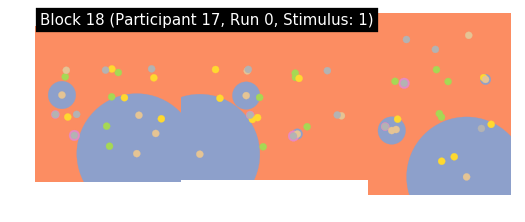

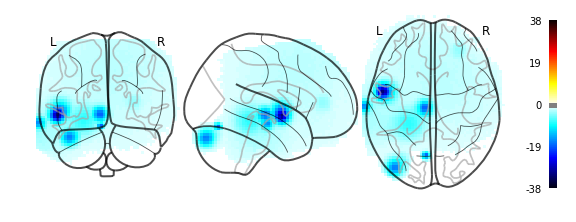

01/09/2019 20:11:15 Reconstruction Error (Frobenius Norm): 5.34106445e+03 out of 8.01030859e+03


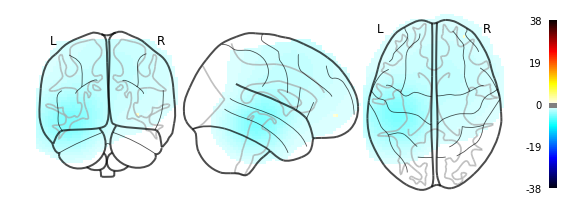

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.2838e-30, 1.0469e-30, 1.2863e-31,  ..., 2.3655e-25, 1.1934e-25,
         2.6553e-25],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.2988e-04, 4.5421e-04, 2.5133e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  3.5407, -29.9749,  13.3521],
        [ -1.7405,  19.9737, -17.4718],
        [  1.2787, -26.2921, -38.5782],
        [ 10.5173,   7.4487,  38.9446],
        [-45.3238,   7.6889,  34.4431],
        [ 55.8126, -37.5702,  -9.7366],
        [-42.6103, -32.1325,  -7.8709],
        [ 47.9223,  11.5067,  33.3658],
        [ 16.9503, -71.7040,  12.4736],
        [  3.

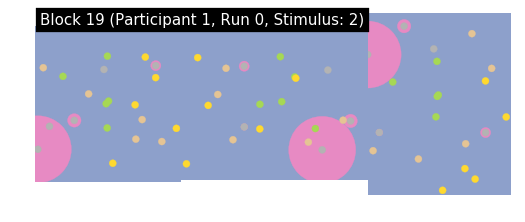

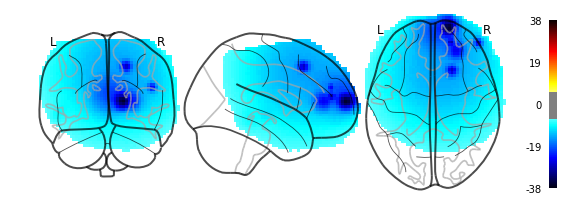

01/09/2019 20:11:42 Reconstruction Error (Frobenius Norm): 6.16126318e+03 out of 4.22614102e+04


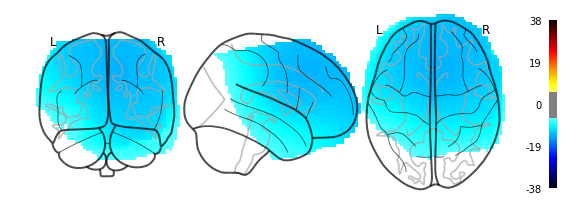

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.5658e-01, 1.5893e-01, 1.6063e-01,  ..., 1.3611e-01, 1.4299e-01,
         1.4042e-01],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3519e-37, 5.3145e-37, 3.4820e-37,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0087e-04, 1.1516e-05, 8.7918e-07,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  -2.2716,  -29.6913,    6.1338],
        [  -1.1883,   28.6626,  -19.3697],
        [   0.2519,   -6.7331,    8.9061],
        [  -0.9339,   -8.1948,   56.1842],
        [ -47.6947,    6.9326,   34.9214],
        [  71.6221,  -29.8018,  -19.7852],
        [   4.7305, -106.9663,  -56.4925],
        [  49.8210,    8.0972,   33.5874],
        [  28.1793,  -84.1335

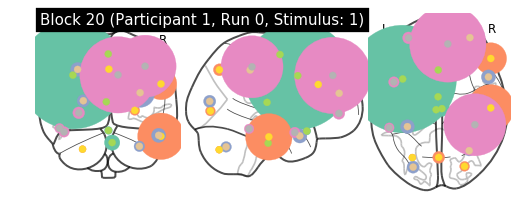

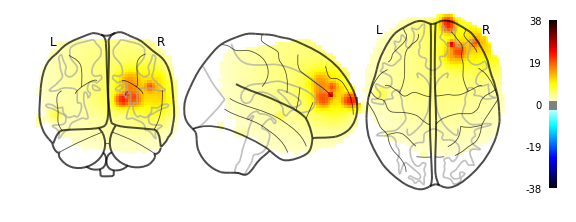

01/09/2019 20:12:09 Reconstruction Error (Frobenius Norm): 3.33358594e+03 out of 1.70966602e+04


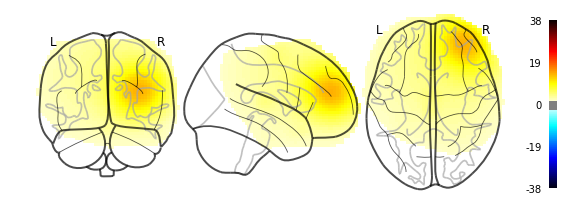

{'factors': tensor([[6.6448e-21, 1.0204e-20, 1.3711e-20,  ..., 3.7959e-27, 1.6953e-26,
         5.0303e-27],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1346e-15, 4.8874e-16, 1.9512e-16,  ..., 7.6660e-12, 6.0638e-12,
         9.2622e-12],
        ...,
        [4.2606e-02, 4.4303e-02, 4.5925e-02,  ..., 7.6967e-02, 8.2030e-02,
         8.3176e-02],
        [1.3567e-40, 1.2478e-40, 1.0089e-40,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.9146e-05, 1.1985e-05, 3.0189e-06,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[-2.1217e+00, -2.2170e+01,  8.1419e+00],
        [ 1.4619e-01,  1.9620e+01, -2.1972e+01],
        [ 4.0359e+00, -2.1031e+01, -3.4759e+01],
        [-7.5958e-02, -8.5813e+00,  5.8467e+01],
        [-3.7277e+01,  1.0151e+01,  3.6213e+01],
        [ 5.5356e+01, -2.0275e+01, -2.8122e+01],
        [-2.7100e+01, -7.2526e+01, -4.1638e+01],
        [ 5.5416e+01,  3.1706e

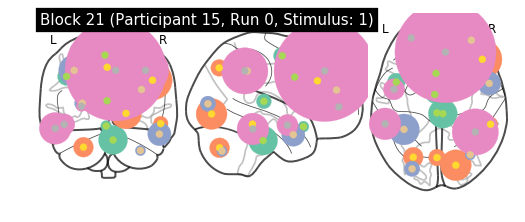

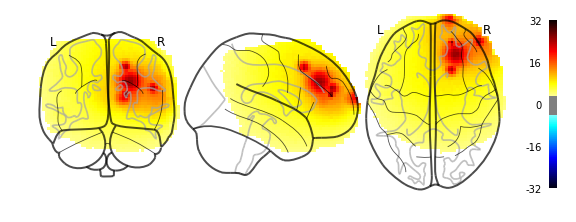

01/09/2019 20:12:36 Reconstruction Error (Frobenius Norm): 3.58296045e+03 out of 2.98401113e+04


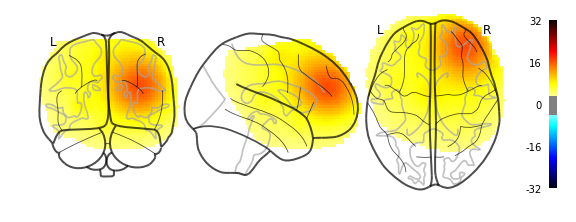

{'factors': tensor([[5.1983e-13, 6.9716e-13, 8.6157e-13,  ..., 9.8084e-17, 2.5302e-16,
         1.0641e-16],
        [1.0487e-37, 4.6691e-38, 1.7832e-38,  ..., 1.3702e-34, 2.0802e-34,
         1.3386e-33],
        [8.5068e-05, 6.8353e-05, 5.3753e-05,  ..., 9.5132e-04, 9.0796e-04,
         9.6601e-04],
        ...,
        [1.9343e-01, 1.9834e-01, 2.0302e-01,  ..., 2.3739e-01, 2.4688e-01,
         2.4690e-01],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.3267e-01, 3.8806e-01, 3.4188e-01,  ..., 7.8730e-09, 8.1448e-09,
         7.4830e-09]]), 'factor_centers': tensor([[ -1.3347, -25.5113,   9.2687],
        [ -2.2773,  16.0924, -17.3316],
        [  4.9553, -26.3635, -32.0044],
        [ -3.6068,  -6.2160,  57.1661],
        [-43.9610,   6.8708,  34.7657],
        [ 55.1335, -37.5147, -14.7962],
        [-26.1470, -72.1255, -39.6191],
        [ 46.4852,  30.8224,  30.8286],
        [ 18.6484, -80.5452,  -4.0347],
        [ -1.

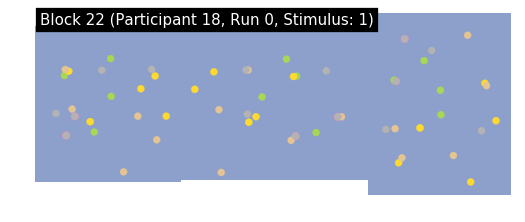

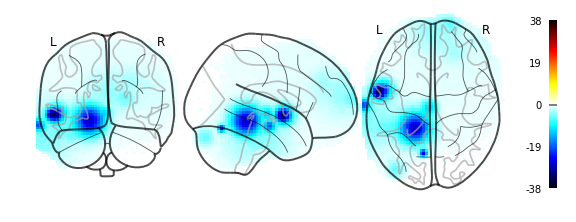

01/09/2019 20:13:03 Reconstruction Error (Frobenius Norm): 5.61469336e+03 out of 1.21460781e+04


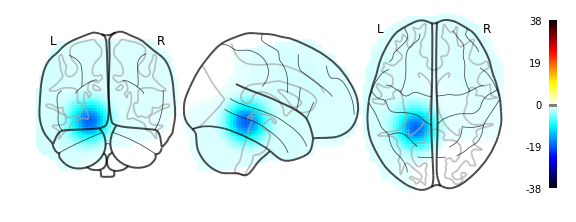

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.6350e-06, 3.9701e-06, 3.3300e-06,  ..., 3.5945e-07, 3.6423e-07,
         5.3932e-07],
        [2.5367e-04, 2.1466e-04, 1.7369e-04,  ..., 7.0332e-12, 8.5147e-12,
         5.8125e-12],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.3993e-07, 2.6784e-07, 9.2823e-08,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  3.0177, -27.4307,  13.8826],
        [-14.7651,  29.4520, -23.6150],
        [-18.9633, -41.2727, -12.6911],
        [  2.4423,  -1.7187,  53.6387],
        [-46.2653,   8.9127,  35.7253],
        [ 60.9080, -33.7643,  -6.9053],
        [-19.0529, -41.3872, -12.7609],
        [ 49.1815,   5.6692,  35.3607],
        [ 34.2515, -98.1905,  21.8939],
        [-41.

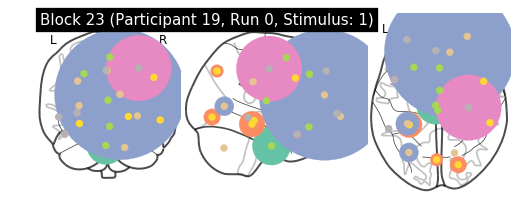

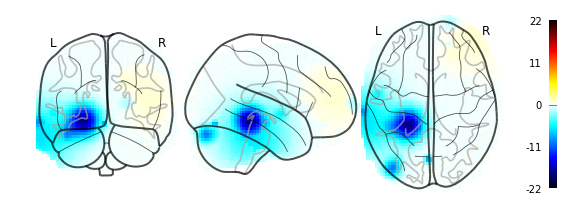

01/09/2019 20:13:30 Reconstruction Error (Frobenius Norm): 4.06937964e+03 out of 9.04035938e+03


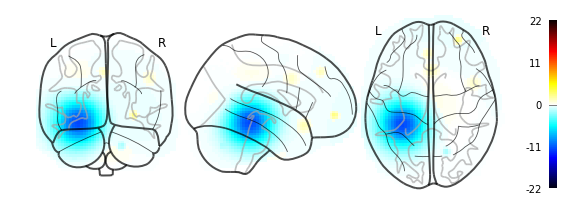

{'factors': tensor([[4.7349e-21, 7.6973e-21, 1.1000e-20,  ..., 1.1922e-25, 5.4338e-25,
         1.5204e-25],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.4229e-03, 4.6678e-03, 3.9683e-03,  ..., 6.6821e-03, 6.3520e-03,
         6.9929e-03],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.4156e-06, 6.2395e-07, 1.8667e-07,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[ -0.3011, -22.8391,   9.8122],
        [  1.4259,  21.8509, -17.6756],
        [ -2.6236, -17.5095, -37.7465],
        [  1.6812,  -1.8605,  55.2797],
        [-25.5745,  22.5119,  37.7472],
        [ 54.5307, -35.8368, -10.9692],
        [-30.3621, -37.9932, -14.6849],
        [ 47.9280,   7.6764,  33.8029],
        [ 21.1726, -80.0697,  -7.3136],
        [ -1.

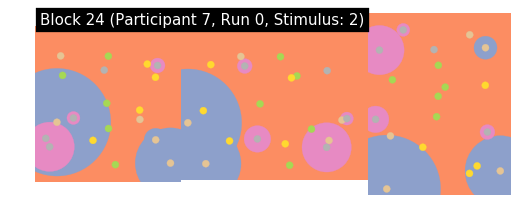

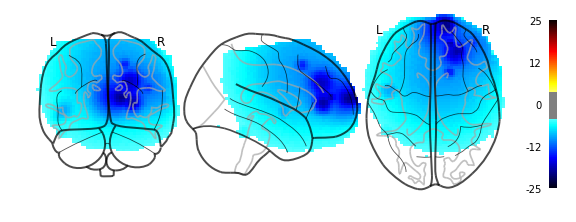

01/09/2019 20:13:57 Reconstruction Error (Frobenius Norm): 5.78530322e+03 out of 2.72746992e+04


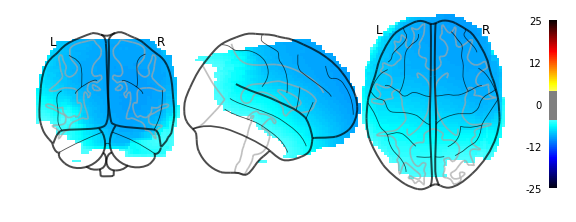

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.1548e-05, 1.6134e-05, 1.1896e-05,  ..., 1.8486e-03, 1.5653e-03,
         2.1568e-03],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.0321e-37, 2.3346e-37, 1.6160e-37,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8986e-01, 1.4881e-01, 1.1372e-01,  ..., 6.2854e-14, 6.0354e-14,
         6.0850e-14]]), 'factor_centers': tensor([[-1.6019e+00, -2.9556e+01,  6.5663e+00],
        [ 2.1740e-01,  2.4558e+01, -1.9961e+01],
        [ 7.4319e+00,  1.5974e+00, -5.7977e+01],
        [ 3.6011e-02, -8.0281e+00,  5.6197e+01],
        [-4.8102e+01,  9.2938e+00,  3.5946e+01],
        [ 8.3820e+01, -3.0198e+00, -3.5425e+01],
        [-1.6091e+01, -6.1637e+01, -3.2413e+01],
        [ 4.9613e+01,  3.5138e

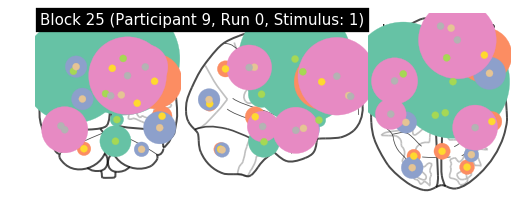

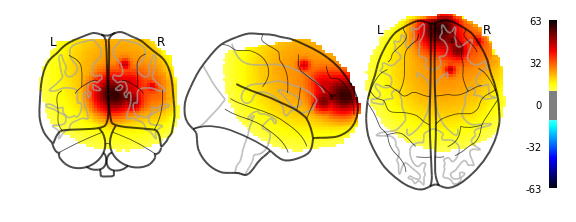

01/09/2019 20:14:25 Reconstruction Error (Frobenius Norm): 5.95330811e+03 out of 9.02931562e+04


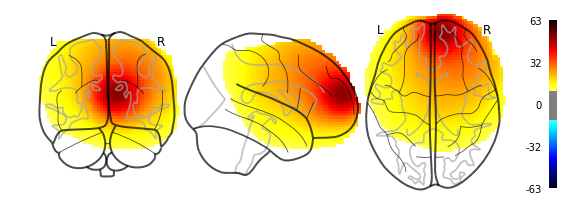

{'factors': tensor([[1.5750e-04, 1.8420e-04, 2.0994e-04,  ..., 2.6923e-06, 3.8696e-06,
         2.7043e-06],
        [1.7656e-34, 1.3088e-34, 8.7837e-35,  ..., 3.7864e-23, 6.2155e-23,
         2.8504e-22],
        [1.7415e-04, 1.4300e-04, 1.1527e-04,  ..., 3.5574e-03, 3.3895e-03,
         3.6266e-03],
        ...,
        [3.0898e-02, 3.2059e-02, 3.3165e-02,  ..., 9.5168e-02, 1.0112e-01,
         1.0301e-01],
        [1.8026e-15, 2.1223e-15, 2.4233e-15,  ..., 2.5368e-13, 3.8155e-13,
         6.6402e-13],
        [2.2391e-01, 2.0278e-01, 1.8019e-01,  ..., 1.3205e-08, 1.3918e-08,
         1.3347e-08]]), 'factor_centers': tensor([[ -2.9127, -27.9839,  16.7253],
        [  9.0148,  32.4380, -10.5391],
        [  7.5149, -25.3910, -33.3047],
        [ 15.6210,   7.3122,  53.7670],
        [-36.6931,  15.4838,  40.3385],
        [ 56.5565, -34.6007,  -6.9340],
        [-25.6111, -70.9521, -41.2247],
        [ 48.6725,  35.2990,  29.7979],
        [ 30.4174, -82.5445,   6.6821],
        [  4.

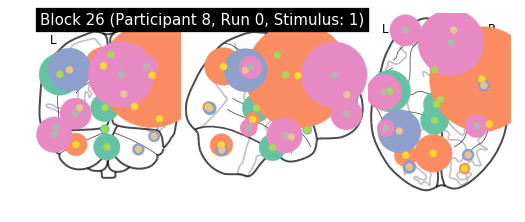

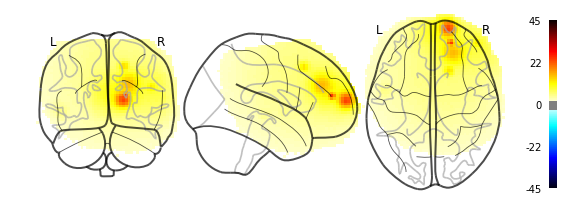

01/09/2019 20:14:52 Reconstruction Error (Frobenius Norm): 2.87746875e+03 out of 2.11259922e+04


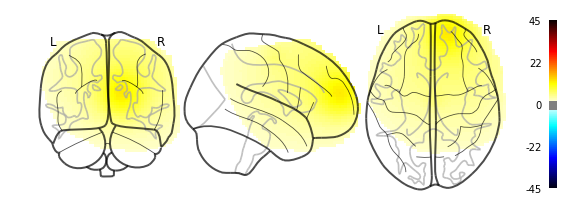

{'factors': tensor([[1.1438e-03, 1.1746e-03, 1.1794e-03,  ..., 4.3128e-05, 5.3031e-05,
         4.1585e-05],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.4135e-05, 1.0251e-05, 7.2471e-06,  ..., 4.0173e-05, 3.5718e-05,
         4.4440e-05],
        ...,
        [1.1740e-02, 1.2382e-02, 1.3004e-02,  ..., 3.3310e-02, 3.6312e-02,
         3.7038e-02],
        [4.6253e-07, 4.5451e-07, 4.3850e-07,  ..., 1.4350e-10, 1.6339e-10,
         2.4898e-10],
        [8.6861e-02, 6.1668e-02, 4.1227e-02,  ..., 6.9948e-28, 8.0347e-28,
         5.3911e-28]]), 'factor_centers': tensor([[ -3.7391, -33.3542,   2.0425],
        [ -3.7852,  20.1310, -20.7966],
        [ -1.5952, -16.6114, -39.3453],
        [  2.4999, -11.2954,  58.0230],
        [-50.8916,  -2.5636,  37.0646],
        [ 53.8877, -37.2862,  -9.8194],
        [-34.1047, -70.1707, -36.7663],
        [ 46.0621,  10.2188,  36.1297],
        [ 27.7616, -84.1247,   3.2852],
        [ -5.

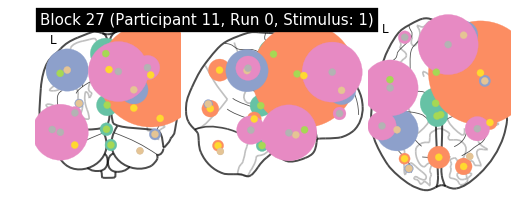

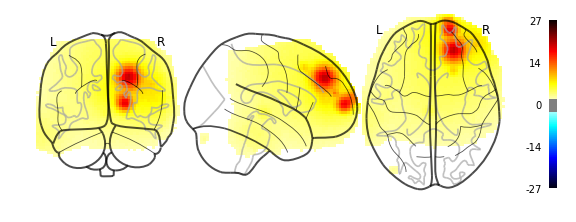

01/09/2019 20:15:20 Reconstruction Error (Frobenius Norm): 2.87400024e+03 out of 2.43472090e+04


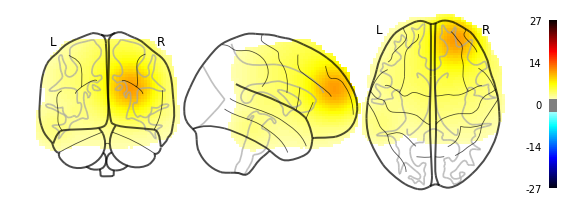

{'factors': tensor([[1.9699e-06, 2.1371e-06, 2.2290e-06,  ..., 4.2975e-08, 6.3879e-08,
         4.2826e-08],
        [1.4932e-27, 7.4885e-28, 3.3716e-28,  ..., 1.6083e-24, 1.9106e-24,
         8.3264e-24],
        [6.5028e-25, 1.3969e-25, 2.6377e-26,  ..., 3.8488e-20, 2.3199e-20,
         4.0364e-20],
        ...,
        [5.6868e-03, 6.0933e-03, 6.4964e-03,  ..., 1.4425e-02, 1.6086e-02,
         1.6338e-02],
        [7.0017e-34, 6.5070e-34, 5.4240e-34,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1245e-01, 3.5703e-01, 3.0227e-01,  ..., 2.6975e-11, 2.7889e-11,
         2.4921e-11]]), 'factor_centers': tensor([[ -1.1538, -28.7635,   4.7081],
        [ -1.9166,  17.2582, -20.7074],
        [  2.7240, -27.3929, -37.2773],
        [ -2.6565, -15.4068,  58.8734],
        [-50.6586,   9.4298,  38.1075],
        [ 54.5288, -35.6767,  -9.3161],
        [-35.3251, -73.7272, -37.3457],
        [ 44.5536,  16.5477,  36.3567],
        [ 26.8450, -81.8673,   1.5852],
        [  0.

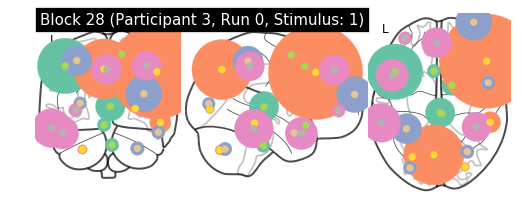

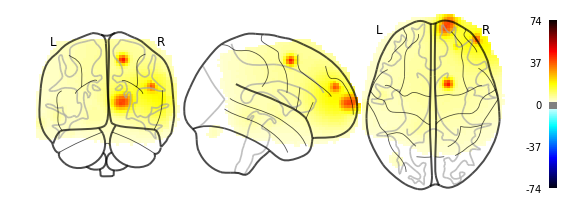

01/09/2019 20:15:47 Reconstruction Error (Frobenius Norm): 5.56119727e+03 out of 2.50038711e+04


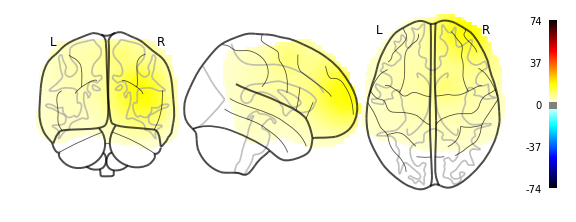

{'factors': tensor([[4.9732e-04, 5.1467e-04, 5.2177e-04,  ..., 2.7383e-04, 3.3413e-04,
         2.7972e-04],
        [4.5031e-24, 2.8102e-24, 1.5915e-24,  ..., 1.4100e-23, 1.9129e-23,
         6.4290e-23],
        [3.4023e-19, 1.0860e-19, 3.1503e-20,  ..., 9.0889e-15, 6.2395e-15,
         9.7621e-15],
        ...,
        [5.3711e-09, 7.1671e-09, 9.3760e-09,  ..., 3.1865e-09, 4.9826e-09,
         5.2960e-09],
        [6.5228e-33, 6.7193e-33, 6.2184e-33,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.1681e-01, 5.7426e-01, 5.2830e-01,  ..., 1.8297e-06, 1.8743e-06,
         1.7759e-06]]), 'factor_centers': tensor([[  2.1408, -25.3982,   3.4956],
        [ -4.4146,  18.3940, -16.0722],
        [  3.7976, -26.2609, -37.2897],
        [ 14.3326,   3.3354,  58.1655],
        [-45.4018,  17.7364,  45.8946],
        [ 54.6943, -35.3344, -13.6259],
        [-27.2548, -71.8271, -42.0495],
        [ 51.0149,  28.8442,  39.7389],
        [ 28.3364, -82.3667,   1.0201],
        [ -4.

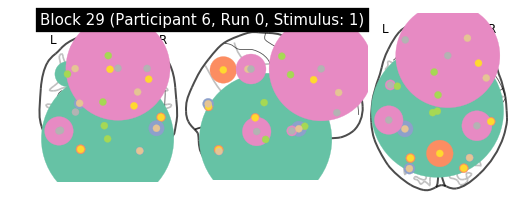

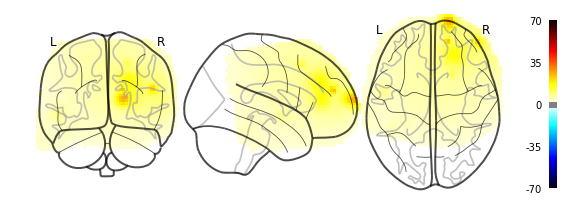

01/09/2019 20:16:14 Reconstruction Error (Frobenius Norm): 3.65794849e+03 out of 2.41306582e+04


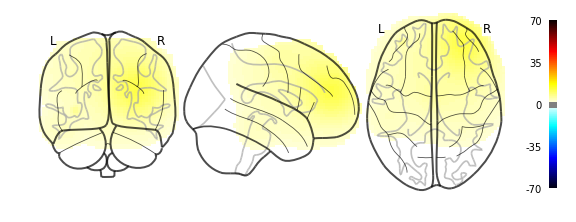

{'factors': tensor([[9.3071e-03, 9.7584e-03, 1.0078e-02,  ..., 6.5171e-04, 7.7089e-04,
         6.6250e-04],
        [4.2101e-32, 2.1361e-32, 9.5030e-33,  ..., 3.4880e-31, 5.0622e-31,
         2.6106e-30],
        [6.6962e-01, 6.6293e-01, 6.5564e-01,  ..., 6.8081e-01, 6.7957e-01,
         6.8193e-01],
        ...,
        [2.1334e-01, 2.1871e-01, 2.2384e-01,  ..., 2.7083e-01, 2.8136e-01,
         2.8047e-01],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.2208e-01, 1.9044e-01, 1.5977e-01,  ..., 4.2509e-10, 4.3447e-10,
         4.1112e-10]]), 'factor_centers': tensor([[ -5.7052, -25.2335,   7.9231],
        [ -4.1811,  17.4638, -16.9946],
        [ -0.7660, -23.6910, -30.8262],
        [ -0.0940,  -6.6559,  56.7254],
        [-42.9203,   2.5228,  37.3215],
        [ 55.4143, -34.6196,  -8.1016],
        [-29.1215, -73.0525, -41.7979],
        [ 42.4621,  26.8412,  31.9470],
        [ 27.0278, -83.6984,   3.8708],
        [  1.

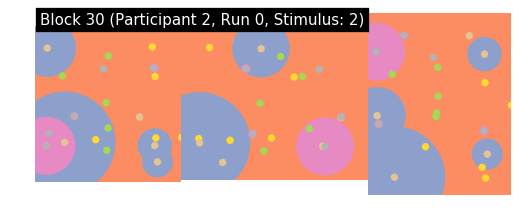

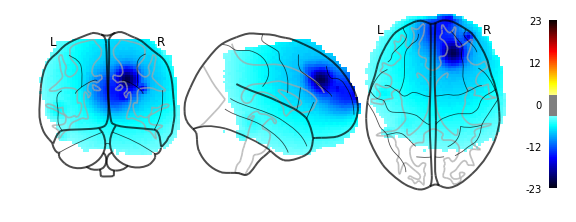

01/09/2019 20:16:42 Reconstruction Error (Frobenius Norm): 5.51271875e+03 out of 1.71280762e+04


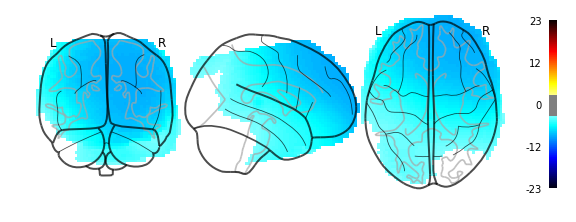

{'factors': tensor([[1.9216e-40, 4.3510e-40, 7.4400e-40,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.4597e-05, 2.1797e-06, 2.5526e-07,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[-2.1990e+00, -2.9624e+01,  7.2307e+00],
        [-3.8640e-01,  2.2274e+01, -1.9493e+01],
        [-1.5738e+00, -2.5509e+01, -4.2955e+01],
        [ 4.5275e-02, -7.9747e+00,  5.6447e+01],
        [-4.8272e+01,  1.5026e+01,  3.5380e+01],
        [ 7.7109e+01, -1.7476e+01, -2.9316e+01],
        [-1.3286e+01, -6.1104e+01, -3.1763e+01],
        [ 4.9258e+01,  6.2927e

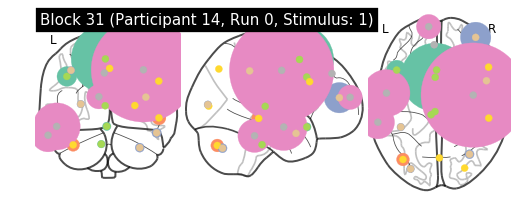

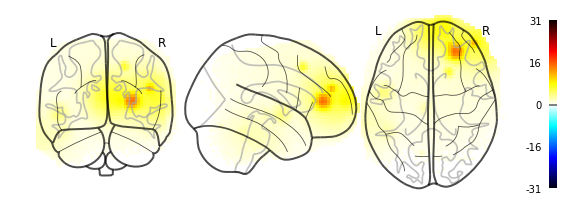

01/09/2019 20:17:10 Reconstruction Error (Frobenius Norm): 2.15031494e+03 out of 7.89742578e+03


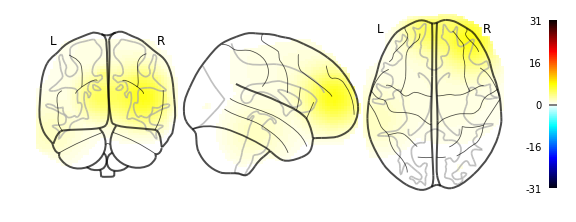

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.6149e-14, 8.8564e-14, 9.9941e-14,  ..., 1.5333e-14, 2.2704e-14,
         3.9362e-14],
        [4.2138e-01, 3.6697e-01, 3.1443e-01,  ..., 6.4833e-09, 6.4302e-09,
         6.2477e-09]]), 'factor_centers': tensor([[ -3.2616, -24.1253,   4.0108],
        [ -1.6273,  19.6518, -17.6779],
        [ -7.3997, -27.4419, -36.3447],
        [ -3.0527,  11.9688,  53.2687],
        [-43.6077,  19.5501,  34.8399],
        [ 53.2618, -30.9998,  -8.7395],
        [-36.9869, -74.5342, -37.1873],
        [ 53.0889,  22.6137,  29.9341],
        [ 27.8845, -83.5673,   4.2570],
        [  1.

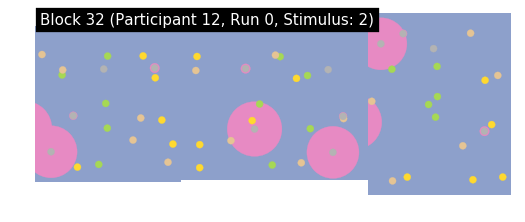

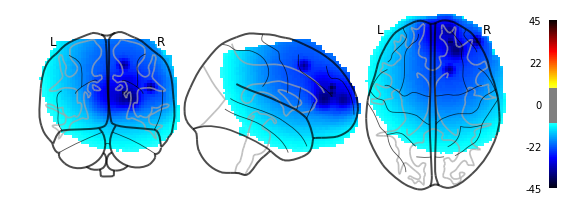

01/09/2019 20:17:38 Reconstruction Error (Frobenius Norm): 1.08103643e+04 out of 7.40379062e+04


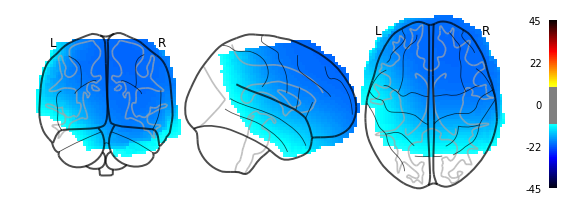

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.2332e-03, 9.4200e-04, 7.0931e-04,  ..., 5.4800e-04, 4.6958e-04,
         5.7980e-04],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.9105e-01, 7.6243e-01, 7.3045e-01,  ..., 6.9098e-05, 6.9882e-05,
         6.8161e-05]]), 'factor_centers': tensor([[ -2.6992, -29.9967,   6.4295],
        [ -1.0511,  23.3375, -19.5241],
        [-10.0359, -16.7192, -57.7516],
        [ -0.7162,  -8.3810,  56.2442],
        [-48.6216,  20.4053,  36.3801],
        [ 56.3325, -37.8331, -11.0288],
        [-32.4498, -93.0454, -60.5411],
        [ 49.3927,   8.7950,  33.3955],
        [ 68.0004, -93.0035, -36.2938],
        [ 36.

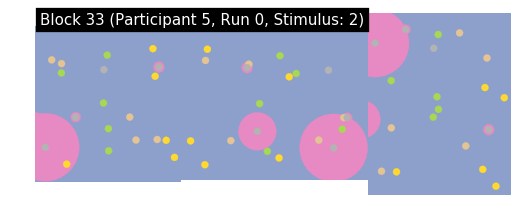

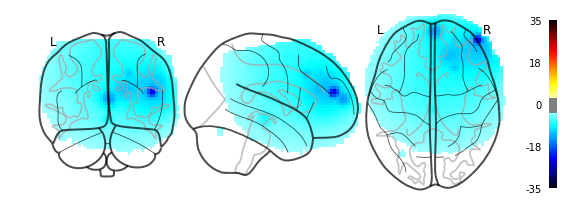

01/09/2019 20:18:06 Reconstruction Error (Frobenius Norm): 5.71671777e+03 out of 2.68645762e+04


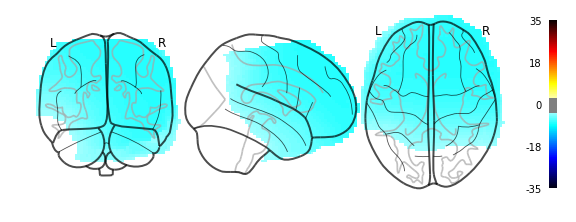

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.3933e-21, 1.2817e-21, 2.7477e-22,  ..., 1.0048e-17, 5.4419e-18,
         1.2647e-17],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.9053e-01, 5.4109e-01, 4.8958e-01,  ..., 1.1495e-08, 1.1648e-08,
         1.1311e-08]]), 'factor_centers': tensor([[  -5.0724,  -30.0379,    6.8573],
        [   0.1095,   56.9273,  -20.0978],
        [   0.3372,  -21.7972,  -43.3652],
        [  -1.1530,   -8.5668,   57.2317],
        [ -49.3784,    8.4211,   38.5087],
        [  69.5926,   -9.5671,  -50.3109],
        [ -43.7786,  -87.5527,  -57.4348],
        [  49.2629,    1.1390,   35.0563],
        [  60.8829, -102.6420

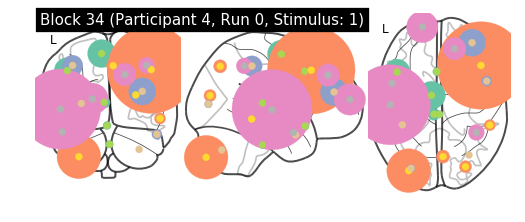

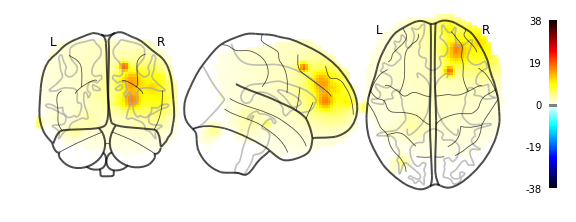

01/09/2019 20:18:33 Reconstruction Error (Frobenius Norm): 2.57342896e+03 out of 1.35716934e+04


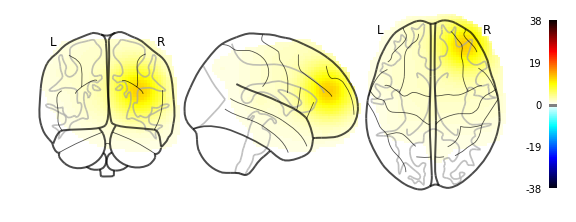

{'factors': tensor([[3.7636e-18, 5.5386e-18, 7.1778e-18,  ..., 8.6620e-27, 3.5262e-26,
         9.2278e-27],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.0355e-16, 1.6266e-16, 2.4663e-16,  ..., 4.3878e-12, 9.1447e-12,
         1.0067e-11],
        [3.2118e-08, 3.4709e-08, 3.6831e-08,  ..., 1.6045e-09, 2.0059e-09,
         2.8296e-09],
        [7.5698e-01, 7.5838e-01, 7.5765e-01,  ..., 5.8853e-02, 6.0301e-02,
         5.9494e-02]]), 'factor_centers': tensor([[ -4.3596, -27.0073,   7.6148],
        [ -1.3607,  17.8580, -16.8015],
        [  1.2858, -27.0386, -36.5743],
        [ -7.0352,  -7.0387,  58.9216],
        [-43.1696,  17.4979,  40.9990],
        [ 54.4110, -38.4014,  -9.3701],
        [-30.9583, -86.2833, -49.6230],
        [ 45.0693,  24.3598,  42.0008],
        [ 28.8341, -82.1585,  15.3098],
        [  5.

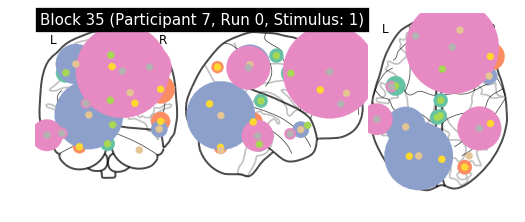

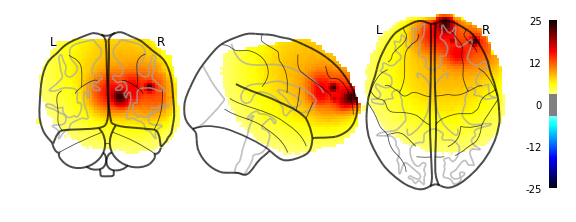

01/09/2019 20:19:01 Reconstruction Error (Frobenius Norm): 2.36141211e+03 out of 2.08170762e+04


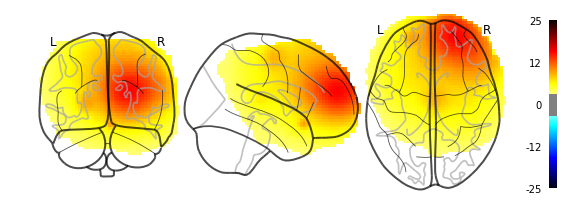

{'factors': tensor([[1.4878e-16, 2.1551e-16, 2.8269e-16,  ..., 7.6180e-19, 2.4406e-18,
         7.5851e-19],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7404e-15, 1.4073e-15, 4.8624e-16,  ..., 1.2200e-14, 9.0726e-15,
         1.1612e-14],
        ...,
        [1.1316e-01, 1.1648e-01, 1.1965e-01,  ..., 1.9196e-01, 2.0090e-01,
         2.0177e-01],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.5288e-01, 3.0274e-01, 2.5509e-01,  ..., 6.0927e-10, 6.0374e-10,
         5.9606e-10]]), 'factor_centers': tensor([[  2.1360, -28.6316,   9.7047],
        [  4.5209,  20.5632, -16.0313],
        [ -0.8007, -30.2416, -35.9344],
        [  2.6909, -12.3697,  57.2901],
        [-44.7603,   2.8781,  38.7125],
        [ 55.0713, -36.6950, -12.4789],
        [-30.3169, -71.1271, -39.1361],
        [ 55.0260,  33.7982,  21.3075],
        [ 27.9508, -82.6334,   6.6441],
        [  3.

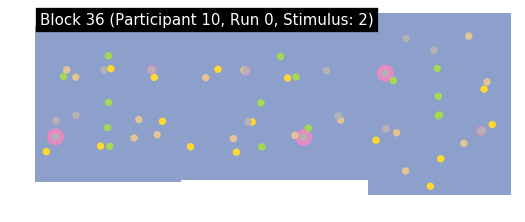

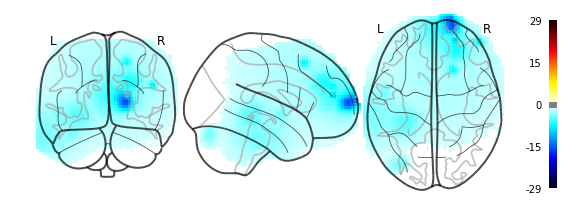

01/09/2019 20:19:30 Reconstruction Error (Frobenius Norm): 3.80395020e+03 out of 8.49833789e+03


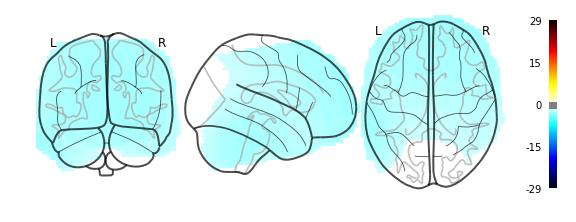

{'factors': tensor([[1.3784e-40, 3.0588e-40, 5.2152e-40,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.1343e-34, 3.3088e-35, 2.9144e-36,  ..., 5.3399e-29, 2.4012e-29,
         5.5978e-29],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.1706e-05, 3.2161e-05, 8.4083e-06,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[   0.2059,  -28.5965,    7.5744],
        [  -0.8643,   21.2362,  -18.9524],
        [   1.4641,  -27.7190,  -38.7368],
        [   0.2920,   -8.0470,   56.4325],
        [ -47.1172,    8.3447,   34.8544],
        [  56.9658,  -37.7994,  -12.4114],
        [ -65.2751,  -54.3748,  -44.2830],
        [  48.3727,   -0.5883,   33.7819],
        [  -8.2148, -102.6795

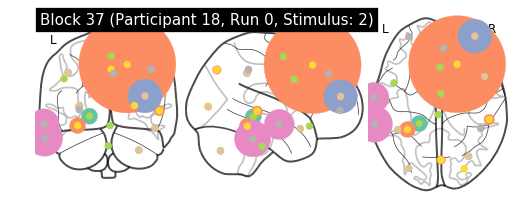

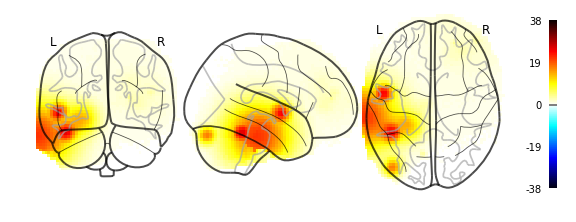

01/09/2019 20:19:57 Reconstruction Error (Frobenius Norm): 3.85479907e+03 out of 1.63179590e+04


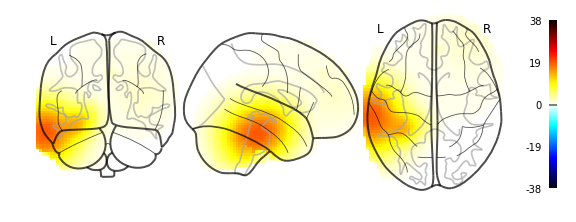

{'factors': tensor([[3.7948e-06, 3.3491e-06, 2.7592e-06,  ..., 2.3545e-18, 3.6043e-18,
         1.9497e-18],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.7333e-01, 4.1538e-01, 3.5957e-01,  ..., 5.4349e-08, 5.3216e-08,
         5.2190e-08]]), 'factor_centers': tensor([[-1.9825e+01, -3.6722e+01, -6.9442e+00],
        [ 1.9130e+00,  2.2488e+01, -1.6791e+01],
        [ 8.8696e-03, -2.7315e+01, -3.8241e+01],
        [ 2.8401e+00, -5.2125e+00,  5.6324e+01],
        [-4.6419e+01,  6.1784e+00,  3.2475e+01],
        [ 5.3773e+01, -3.2444e+01, -1.1233e+00],
        [-3.2270e+01, -4.2990e+01, -1.6834e+01],
        [ 2.0014e+01,  2.5722e

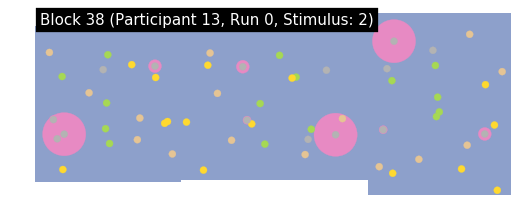

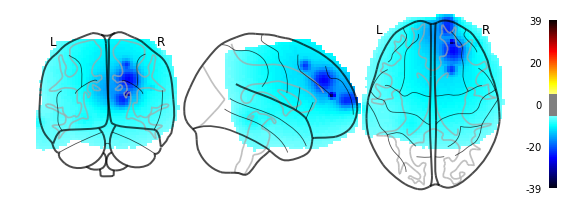

01/09/2019 20:20:25 Reconstruction Error (Frobenius Norm): 7.71119141e+03 out of 3.44333594e+04


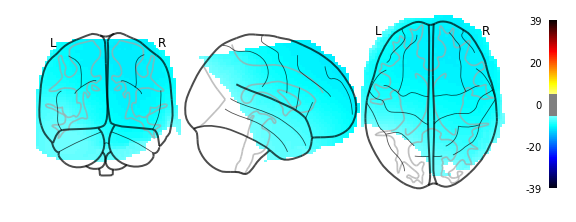

{'factors': tensor([[1.2051e-43, 2.7746e-43, 4.7644e-43,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0893e-03, 1.9317e-03, 1.7689e-03,  ..., 5.4919e-06, 5.4846e-06,
         7.0651e-06],
        [2.0227e-03, 8.9546e-04, 3.0281e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  -1.7817,  -29.4511,    6.8978],
        [  -2.8786,   24.3540,  -20.1258],
        [   1.2993,  -24.4815,  -35.7487],
        [  -0.4861,   -9.0091,   57.6396],
        [ -48.5877,    8.3852,   34.7350],
        [  59.2692,  -38.2855,  -14.4959],
        [ -47.7764,  -89.0350,  -63.0951],
        [  49.8232,    4.1778,   33.7104],
        [  62.2847, -106.9180

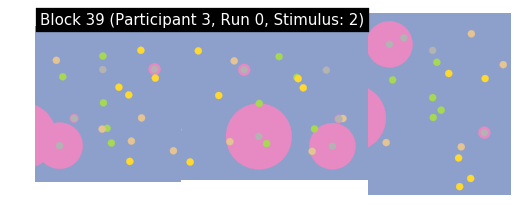

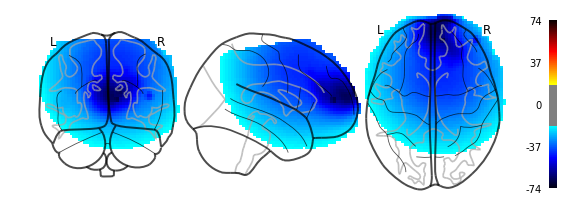

01/09/2019 20:20:53 Reconstruction Error (Frobenius Norm): 1.72677051e+04 out of 1.33302312e+05


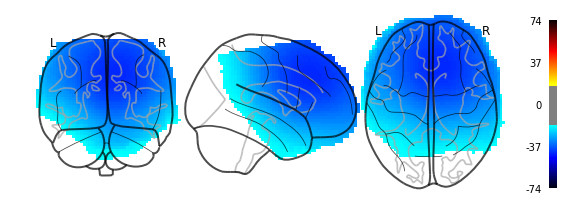

{'factors': tensor([[6.1399e-21, 9.5533e-21, 1.2731e-20,  ..., 8.8460e-33, 4.7512e-32,
         8.0289e-33],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.5306e-01, 7.2628e-01, 6.9755e-01,  ..., 1.2249e-03, 1.2212e-03,
         1.2210e-03]]), 'factor_centers': tensor([[  -5.1254,  -30.3765,    7.0633],
        [  -1.3128,   27.7250,  -19.7745],
        [   3.2379,  -22.6231,  -35.1698],
        [  -5.6876,   -9.4923,   56.3026],
        [ -47.8843,    9.1776,   34.4485],
        [  11.1804,   15.9242,   23.4632],
        [  22.6566, -103.1020,  -54.5644],
        [  49.4455,   10.6086,   33.0764],
        [  21.5336,  -72.9798

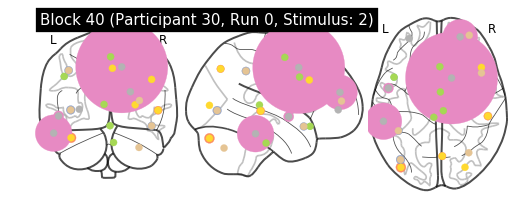

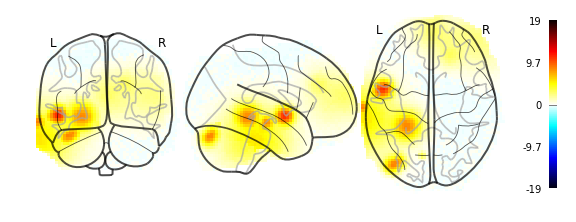

01/09/2019 20:21:21 Reconstruction Error (Frobenius Norm): 2.33800415e+03 out of 7.11559814e+03


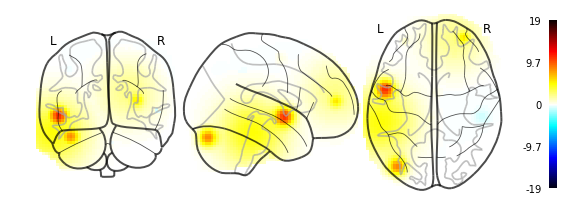

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.4742e-08, 2.7345e-08, 2.9777e-08,  ..., 3.1569e-05, 3.9287e-05,
         4.7594e-05],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5321e-01, 4.0829e-01, 3.6291e-01,  ..., 6.0029e-07, 6.0210e-07,
         5.8489e-07]]), 'factor_centers': tensor([[ -4.5230, -30.1432,   5.3924],
        [  1.8082,  23.0811, -17.0355],
        [  5.5160, -23.2080, -34.6427],
        [  2.4064,  -3.4884,  55.5287],
        [-46.3960,  12.0395,  34.8339],
        [ 52.3884, -28.9079,  -0.7639],
        [-39.1772, -82.7818, -29.6561],
        [ 45.5540,  22.3079,  31.6929],
        [ 28.2657, -82.7652,   5.0204],
        [  4.

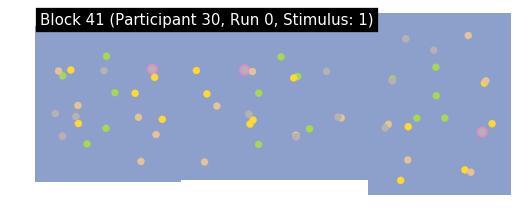

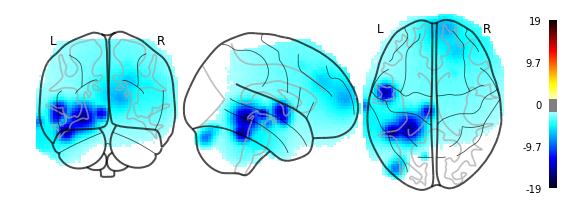

01/09/2019 20:21:48 Reconstruction Error (Frobenius Norm): 3.97609888e+03 out of 9.54044141e+03


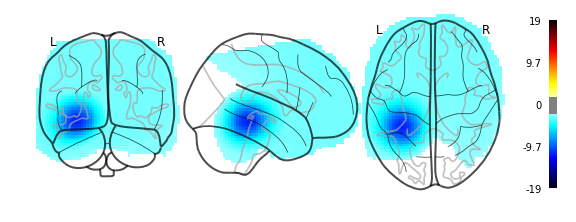

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.5645e-05, 4.1079e-05, 2.4683e-05,  ..., 2.8487e-11, 2.4670e-11,
         2.7516e-11],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.4007e-05, 3.0989e-05, 1.4762e-05,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  6.9811, -30.9627,  17.8008],
        [ -2.3821,  22.5491, -19.7673],
        [-22.3327, -31.0627, -36.1276],
        [ -1.9086,  -7.4618,  56.0469],
        [-48.0344,  10.1347,  35.4344],
        [ 56.7853, -36.8420, -10.2787],
        [-31.4476, -40.0736, -14.6942],
        [ 48.6866,   5.9206,  33.8843],
        [ 28.2060, -85.4485,  17.0786],
        [-39.

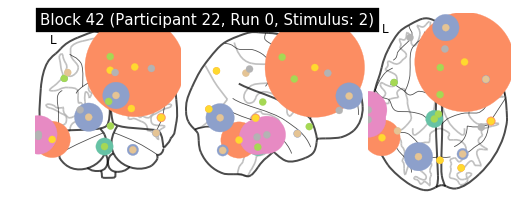

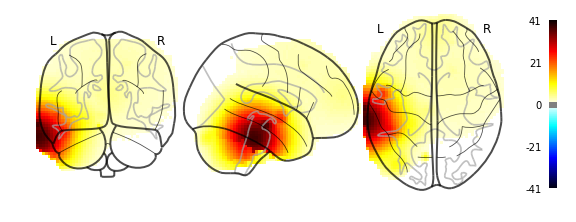

01/09/2019 20:22:16 Reconstruction Error (Frobenius Norm): 2.55203955e+03 out of 2.63910801e+04


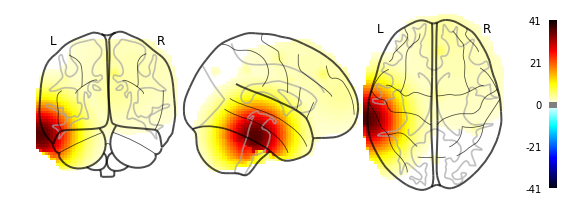

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.9204e-10, 9.0712e-11, 4.0348e-11,  ..., 2.0532e-11, 1.5688e-11,
         1.9179e-11],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5856e-01, 4.0341e-01, 3.4983e-01,  ..., 5.2458e-09, 5.1762e-09,
         5.1425e-09]]), 'factor_centers': tensor([[  0.3377, -26.7102,   8.5341],
        [  2.2948,  22.2221, -17.3385],
        [ -3.9842, -31.9012, -38.9275],
        [  2.0311,  -6.2998,  55.7473],
        [-46.3270,   6.4653,  32.7729],
        [ 55.6335, -34.2079,  -8.4905],
        [-59.0631, -51.6355, -31.4621],
        [ 27.7921,  28.0610,  44.8111],
        [ 24.2649, -83.3786,   1.0796],
        [  1.

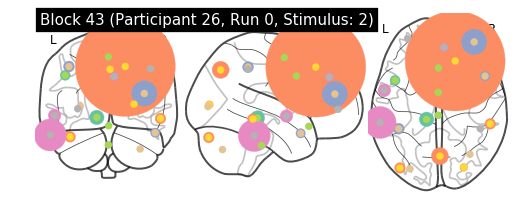

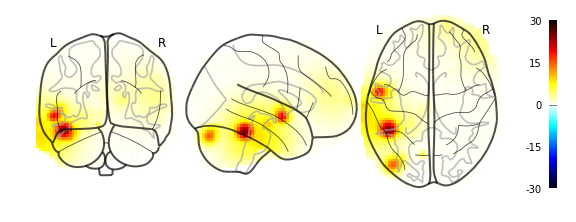

01/09/2019 20:22:43 Reconstruction Error (Frobenius Norm): 2.98913599e+03 out of 1.08085703e+04


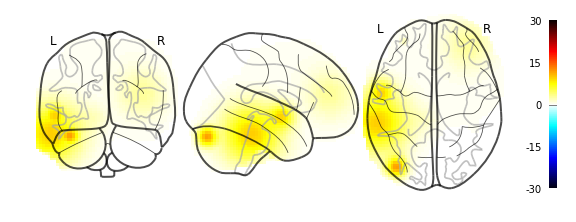

{'factors': tensor([[1.3360e-09, 1.1021e-09, 8.3511e-10,  ..., 3.0362e-19, 4.9434e-19,
         2.7249e-19],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7952e-01, 3.2748e-01, 2.7767e-01,  ..., 2.8553e-09, 2.8346e-09,
         2.7389e-09]]), 'factor_centers': tensor([[-1.2143e+01, -3.2319e+01, -8.2931e+00],
        [ 3.3677e-01,  2.1814e+01, -1.7040e+01],
        [ 5.9133e-02, -2.8045e+01, -3.7165e+01],
        [ 1.3048e-01, -3.9908e+00,  5.5407e+01],
        [-4.5309e+01,  8.7022e+00,  3.6021e+01],
        [ 5.4860e+01, -3.7065e+01, -9.3948e+00],
        [-4.0135e+01, -8.3433e+01, -2.8711e+01],
        [ 1.7906e+01,  2.9072e

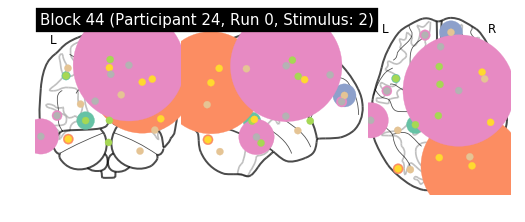

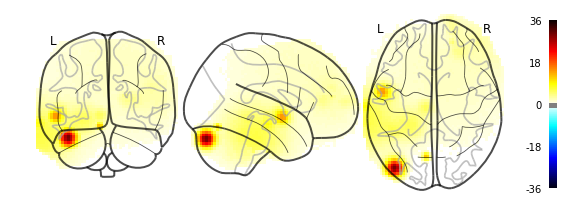

01/09/2019 20:23:10 Reconstruction Error (Frobenius Norm): 1.56772778e+03 out of 8.88719434e+03


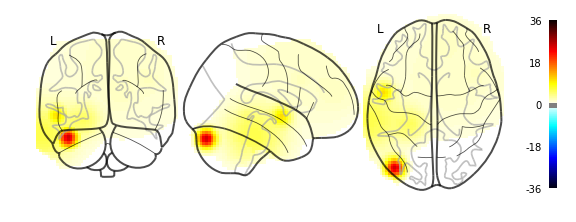

{'factors': tensor([[1.1948e-04, 9.8666e-05, 7.6970e-05,  ..., 3.0622e-16, 3.9869e-16,
         2.5573e-16],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.6203e-01, 4.0648e-01, 3.5251e-01,  ..., 9.8520e-09, 9.7230e-09,
         9.6282e-09]]), 'factor_centers': tensor([[-23.8706, -38.0000, -11.5911],
        [  1.1754,  23.2089, -11.4026],
        [  0.2545, -28.4878, -34.5836],
        [  1.9573,   4.4766,  52.6208],
        [-44.4238,  10.6302,  35.5008],
        [ 55.2198, -35.4842,  -9.7538],
        [-42.0609, -84.3175, -31.0694],
        [ 46.2847,  17.3615,  32.0533],
        [ 35.6630, -81.1995,  28.8590],
        [  1.

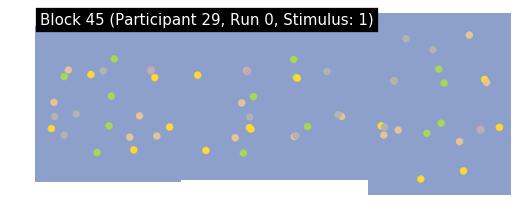

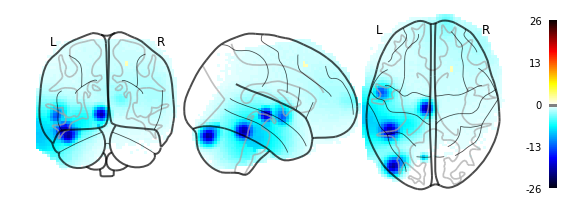

01/09/2019 20:23:38 Reconstruction Error (Frobenius Norm): 4.48935840e+03 out of 9.81504688e+03


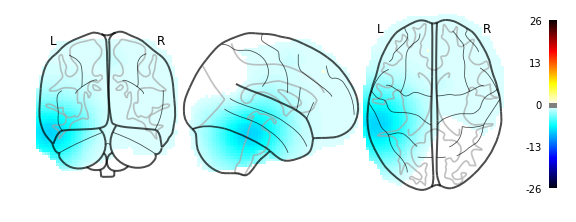

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.8590e-06, 1.0218e-06, 5.3904e-07,  ..., 6.7268e-10, 5.1372e-10,
         5.2176e-10],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0221e-07, 3.1371e-08, 5.2512e-09,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  3.1762, -36.3964,  14.1539],
        [  0.7697,  20.5297, -17.2402],
        [-11.8833, -47.0399, -45.1742],
        [  6.2496,   5.8674,  53.3156],
        [-46.4080,   8.1830,  34.5858],
        [ 64.4747, -40.7723, -18.3991],
        [-59.8822, -39.1464, -20.0415],
        [ 48.8661,   9.7066,  33.6001],
        [ 26.7530, -86.4968, -42.4384],
        [-18.

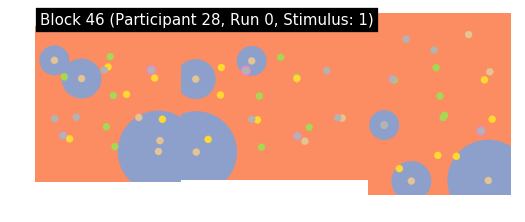

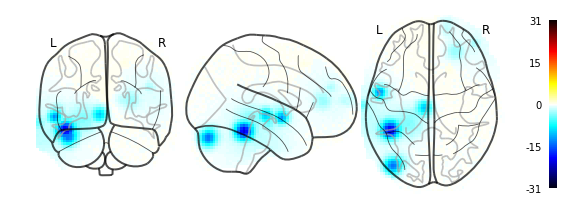

01/09/2019 20:24:05 Reconstruction Error (Frobenius Norm): 4.56572803e+03 out of 7.77138086e+03


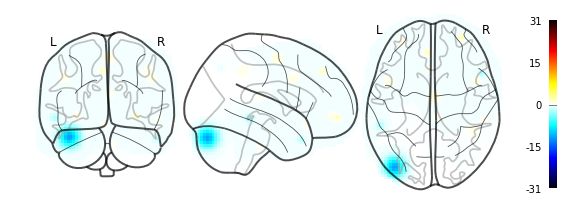

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 5.7220e-32, 2.0405e-32,
         5.9350e-32],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.4811e-09, 2.4550e-10, 2.0978e-11,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  5.2503, -30.3460,  14.8230],
        [ -2.0416,  22.0786, -18.1143],
        [  6.8554, -28.0215, -38.9853],
        [  1.9729,  -7.7716,  55.6431],
        [-46.2784,   9.1017,  34.4689],
        [ 56.9051, -32.1640, -10.2135],
        [-40.7240, -84.1424, -30.7828],
        [ 48.7574,   9.2062,  33.1482],
        [ 19.1691, -71.1822,  15.9127],
        [ -0.

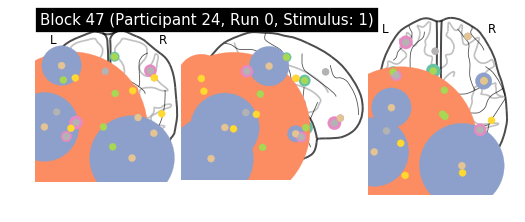

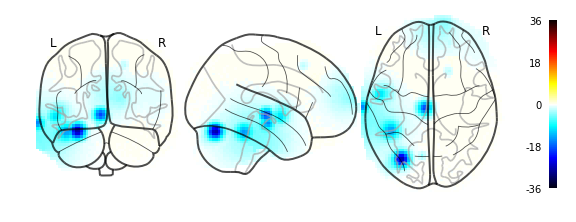

01/09/2019 20:24:34 Reconstruction Error (Frobenius Norm): 5.30307568e+03 out of 8.88816602e+03


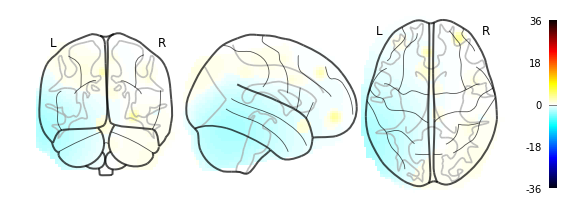

{'factors': tensor([[1.9848e-35, 6.3200e-35, 1.6667e-34,  ..., 2.9745e-34, 4.2782e-33,
         2.8298e-34],
        [1.0069e-22, 6.0204e-23, 3.2847e-23,  ..., 1.6647e-22, 2.0705e-22,
         7.0079e-22],
        [7.1349e-25, 1.5485e-25, 2.9760e-26,  ..., 2.7426e-18, 1.5732e-18,
         2.9321e-18],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0089e-29, 1.3331e-29, 7.9940e-30,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0323e-09, 3.1137e-09, 1.1447e-09,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  7.2329, -29.2930,  16.9343],
        [ -5.1548,  18.5996, -18.3532],
        [  4.6354, -26.8496, -39.2231],
        [  6.5658,  -1.7355,  55.6042],
        [-47.2893,  17.4053,  31.1131],
        [ 56.1828, -33.3821,  -4.4227],
        [-39.3627, -57.4457, -19.6735],
        [ 48.4383,   8.2380,  33.4120],
        [ 25.6933, -88.6218,  19.8479],
        [-34.

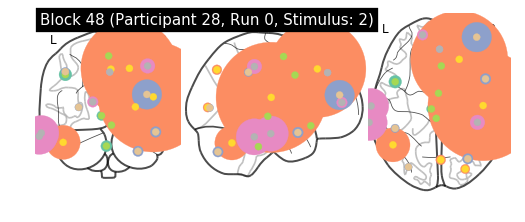

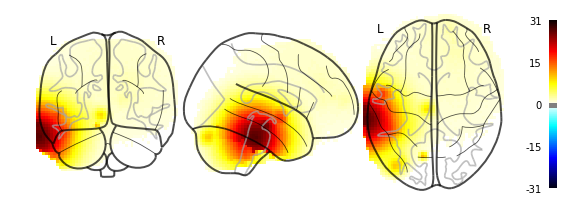

01/09/2019 20:25:01 Reconstruction Error (Frobenius Norm): 2.01468555e+03 out of 1.97192852e+04


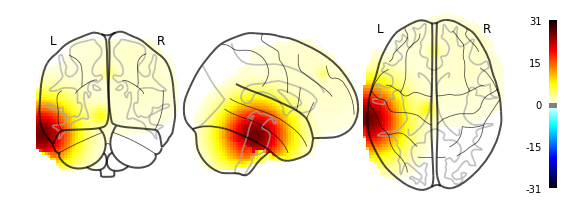

{'factors': tensor([[1.2319e-26, 8.9081e-27, 5.3000e-27,  ..., 1.4538e-39, 5.0069e-39,
         2.3101e-39],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.3929e-25, 5.6704e-26, 8.1950e-27,  ..., 2.4604e-25, 1.3155e-25,
         2.1524e-25],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.1448e-01, 4.5565e-01, 3.9806e-01,  ..., 1.5527e-08, 1.5344e-08,
         1.5034e-08]]), 'factor_centers': tensor([[ -7.0670, -21.3788,  -6.4846],
        [  3.4027,  23.8826, -16.3998],
        [ -1.9749, -31.2598, -38.4225],
        [  0.3613,  -4.8470,  56.4343],
        [-45.1516,   7.2164,  36.8659],
        [ 47.3335, -17.7931,  13.3749],
        [-47.5075, -59.1478, -34.5178],
        [ 22.1989,  30.8050,  43.3580],
        [ 28.4948, -84.5650,   2.8323],
        [  2.

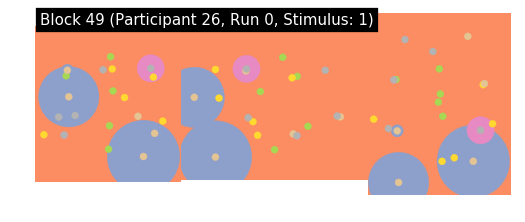

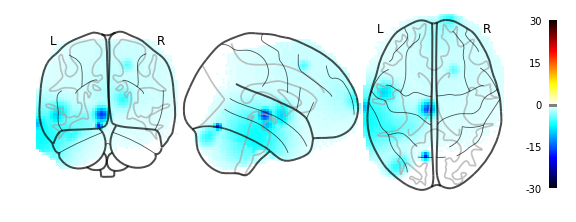

01/09/2019 20:25:29 Reconstruction Error (Frobenius Norm): 3.17984131e+03 out of 7.51167383e+03


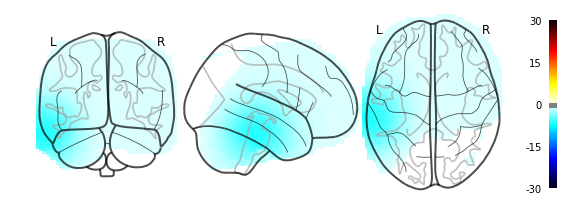

{'factors': tensor([[1.3452e-43, 7.3288e-43, 3.1277e-42,  ..., 0.0000e+00, 2.8026e-45,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.2070e-31, 4.3916e-32, 5.1834e-33,  ..., 9.0267e-26, 4.0593e-26,
         1.8279e-25],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.3276e-10, 3.2862e-11, 4.2127e-12,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  4.9410, -29.1777,  19.5607],
        [  1.2341,  20.8332, -17.0608],
        [  0.2410, -14.2585, -41.6310],
        [  2.3439,  -5.6291,  55.5517],
        [-44.3250,   9.5777,  35.4844],
        [ 57.2782, -36.9597, -12.1683],
        [-67.7613, -32.1037, -26.4981],
        [ 47.4440,   4.1850,  34.0335],
        [ 17.0377, -72.7044,  12.6228],
        [  4.

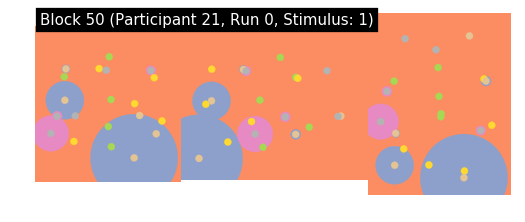

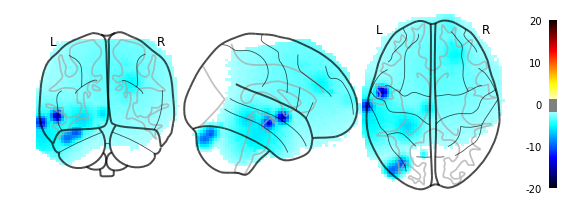

01/09/2019 20:25:57 Reconstruction Error (Frobenius Norm): 2.62180664e+03 out of 6.85666260e+03


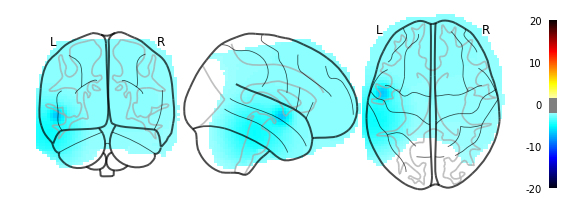

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 1.5470e-42, 4.3721e-43,
         1.8819e-42],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.6773e-01, 4.1833e-01, 3.6889e-01,  ..., 1.4377e-07, 1.4400e-07,
         1.3957e-07]]), 'factor_centers': tensor([[ 2.8252e+00, -2.9666e+01,  1.0529e+01],
        [-9.6297e-04,  2.2196e+01, -1.7883e+01],
        [ 3.2044e+00, -2.6400e+01, -3.9111e+01],
        [ 9.7273e-01, -8.1901e+00,  5.5463e+01],
        [-4.6311e+01,  7.9218e+00,  3.4497e+01],
        [ 5.6459e+01, -3.8545e+01, -1.2012e+01],
        [-3.6160e+01, -6.3391e+01, -3.3552e+01],
        [ 4.8290e+01,  1.0207e

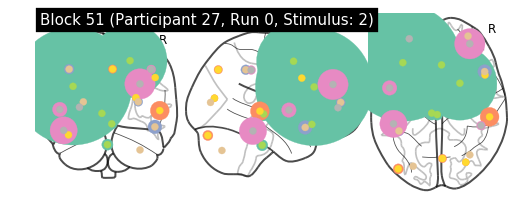

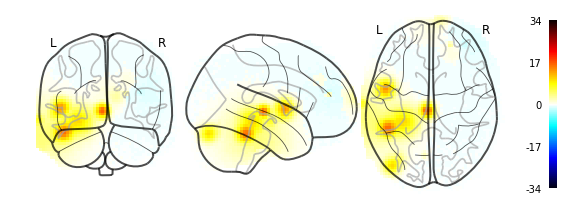

01/09/2019 20:26:25 Reconstruction Error (Frobenius Norm): 3.20902686e+03 out of 8.93015723e+03


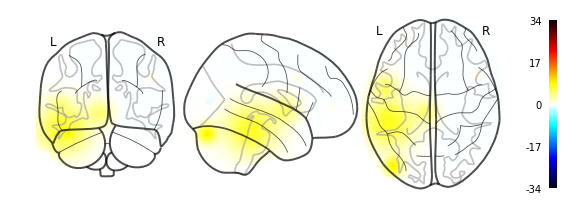

{'factors': tensor([[9.3437e-13, 8.6315e-13, 7.2574e-13,  ..., 1.8735e-19, 3.6757e-19,
         2.0403e-19],
        [1.4013e-45, 1.4013e-45, 0.0000e+00,  ..., 1.4008e-34, 2.3944e-34,
         2.1490e-33],
        [1.1714e-25, 2.1509e-26, 3.4213e-27,  ..., 2.3640e-24, 1.3689e-24,
         2.5064e-24],
        ...,
        [3.3511e-11, 4.0325e-11, 4.7589e-11,  ..., 5.7096e-06, 8.0304e-06,
         9.3371e-06],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6568e-01, 1.4057e-01, 1.1642e-01,  ..., 2.6502e-10, 2.7274e-10,
         2.4749e-10]]), 'factor_centers': tensor([[-6.7437e+00, -2.5783e+01, -4.0259e+00],
        [ 3.5936e+00,  2.4944e+01, -1.5008e+01],
        [-9.4414e-01, -2.7278e+01, -3.6916e+01],
        [ 2.2898e+01,  5.7179e+00,  5.1450e+01],
        [-3.7111e+01,  2.7340e+01,  2.4410e+01],
        [ 5.4145e+01, -2.9681e+01, -1.0880e+00],
        [-4.1907e+01, -8.4443e+01, -2.6648e+01],
        [ 4.9326e+01,  1.4375e

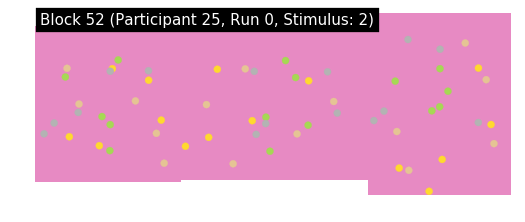

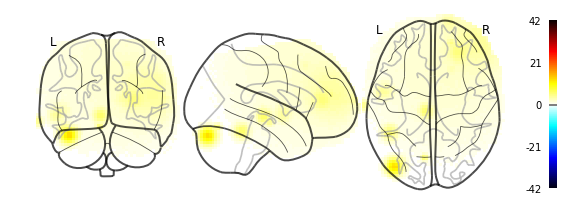

01/09/2019 20:26:52 Reconstruction Error (Frobenius Norm): 1.87678296e+03 out of 5.31042822e+03


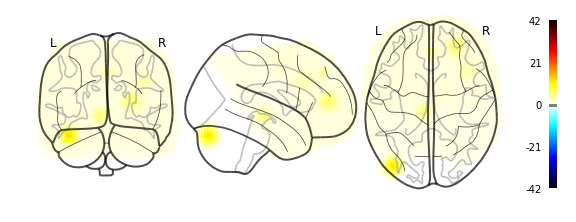

{'factors': tensor([[1.2891e-31, 8.1532e-32, 4.0781e-32,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0641e-33, 2.2552e-34, 2.1013e-35,  ..., 2.1616e-26, 8.4403e-27,
         3.5634e-26],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [9.9468e-01, 9.9435e-01, 9.9393e-01,  ..., 9.1799e-01, 9.1827e-01,
         9.1811e-01]]), 'factor_centers': tensor([[  -6.6304,  -23.3553,   -7.3591],
        [   1.9806,   20.9794,  -15.8534],
        [   1.6325,  -19.0806,  -43.2208],
        [  10.3769,   -2.7015,   52.1482],
        [ -45.1553,    7.9049,   34.2810],
        [  55.6747,  -37.7614,  -11.1074],
        [ -41.0020,  -83.5813,  -28.6399],
        [  42.4323,   21.6165,   30.8678],
        [  -9.4538, -108.0170

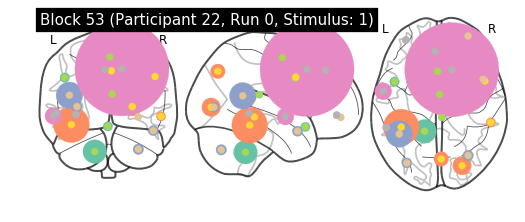

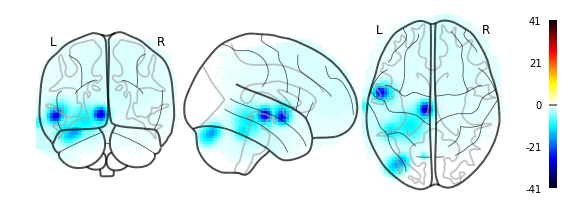

01/09/2019 20:27:19 Reconstruction Error (Frobenius Norm): 5.11723291e+03 out of 9.50100293e+03


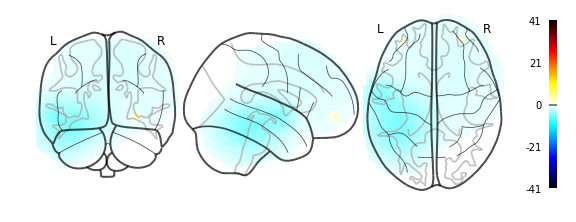

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 1.4013e-45, 1.4013e-45,
         2.3822e-44],
        [5.8882e-05, 3.7165e-05, 2.2711e-05,  ..., 3.2942e-08, 2.6928e-08,
         2.7611e-08],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0696e-04, 8.7411e-05, 5.2093e-05,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  3.9687, -30.2952,  16.3018],
        [ -0.4806,  18.1470, -17.6881],
        [-14.2693, -44.8852, -44.2100],
        [  1.6170,  -6.1399,  55.2504],
        [-45.8521,   7.3411,  33.5950],
        [ 55.4456, -35.5672,  -7.1871],
        [-38.8161, -40.4311, -15.8541],
        [ 49.1745,   8.0551,  34.7290],
        [ 25.1655, -81.0085,   3.0939],
        [  3.

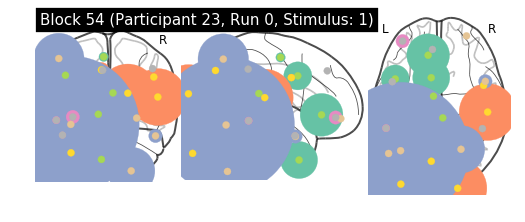

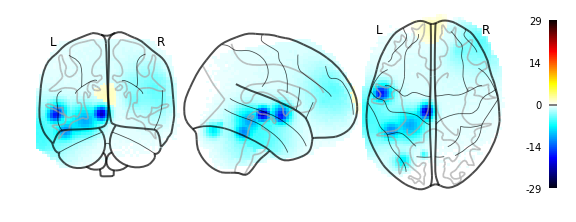

01/09/2019 20:27:46 Reconstruction Error (Frobenius Norm): 5.16001562e+03 out of 9.67469922e+03


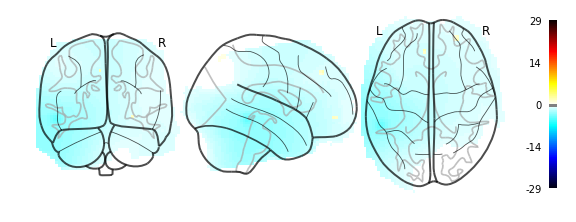

{'factors': tensor([[8.1013e-40, 3.3575e-39, 1.1115e-38,  ..., 7.7632e-43, 1.9419e-41,
         6.5441e-43],
        [1.7819e-03, 1.7618e-03, 1.7249e-03,  ..., 7.7630e-04, 8.3040e-04,
         9.5645e-04],
        [3.4594e-04, 2.7688e-04, 2.1871e-04,  ..., 6.1277e-04, 5.4465e-04,
         7.2979e-04],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0326e-29, 3.2652e-29, 2.3898e-29,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0136e-05, 1.4252e-05, 3.6685e-06,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[   4.9058,  -30.7865,   17.4896],
        [ -10.5110,   35.1446,   -4.9564],
        [  -7.2485,   11.4995,  -52.4722],
        [  -4.8802,   -7.9410,   55.4698],
        [ -45.0829,   10.1706,   36.0572],
        [  52.1056,  -24.6330,   13.1856],
        [ -39.2204, -100.4762,  -45.5026],
        [  47.8581,    3.3822,   34.2284],
        [  20.5631, -104.8601

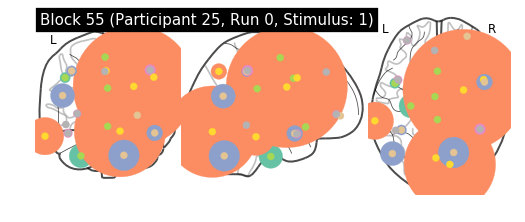

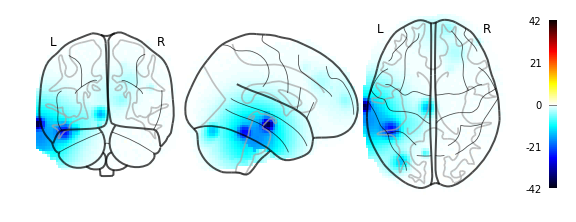

01/09/2019 20:28:14 Reconstruction Error (Frobenius Norm): 4.26467041e+03 out of 1.50006904e+04


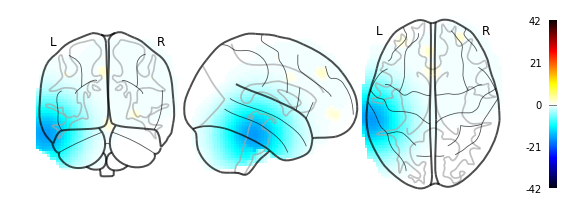

{'factors': tensor([[3.3198e-31, 1.5714e-30, 6.1258e-30,  ..., 1.6956e-43, 3.7765e-42,
         1.3032e-43],
        [4.2039e-45, 1.4013e-45, 0.0000e+00,  ..., 5.4034e-39, 8.5105e-39,
         8.2240e-38],
        [7.2261e-05, 4.3422e-05, 2.5263e-05,  ..., 1.3725e-10, 1.0681e-10,
         1.5327e-10],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5527e-12, 6.3270e-13, 5.8082e-14,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[ -0.7105, -32.5625,  22.5388],
        [ -0.7159,  18.3989, -17.6755],
        [-28.7099, -18.2516, -48.7790],
        [ -3.3575,  -8.3482,  55.1911],
        [-45.4202,   5.6498,  33.5537],
        [ 26.7452,  -1.4328,  24.3549],
        [-66.5814, -33.8148, -27.9883],
        [ 47.8617,   9.4875,  34.0158],
        [ 12.3172, -79.7210, -22.6891],
        [ -2.

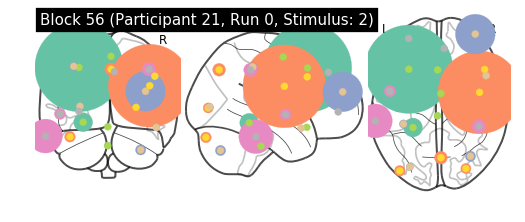

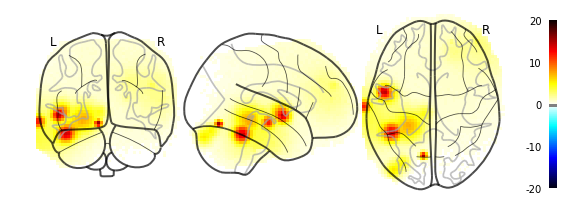

01/09/2019 20:28:42 Reconstruction Error (Frobenius Norm): 2.17664526e+03 out of 8.52456250e+03


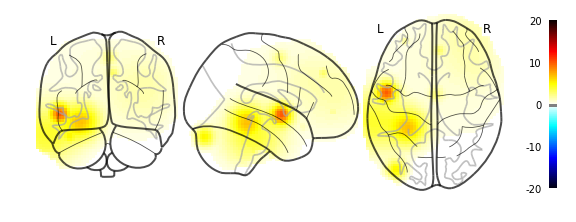

{'factors': tensor([[7.4460e-04, 6.1004e-04, 4.7516e-04,  ..., 3.5357e-15, 4.3400e-15,
         2.8683e-15],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.2384e-01, 3.6934e-01, 3.1685e-01,  ..., 6.7272e-09, 6.6437e-09,
         6.5368e-09]]), 'factor_centers': tensor([[-26.4515, -40.9182, -13.3324],
        [ -0.5304,  19.6579, -18.0859],
        [ -0.6727, -28.5755, -37.9943],
        [  2.8481,  -5.1747,  55.9589],
        [-30.7900,  20.3967,  44.2660],
        [ 43.5839,  -3.9479,  25.0473],
        [-40.3292, -86.4603, -28.6611],
        [ 48.9256,  20.1003,  35.0599],
        [ 29.2090, -84.0284,   2.2974],
        [  2.

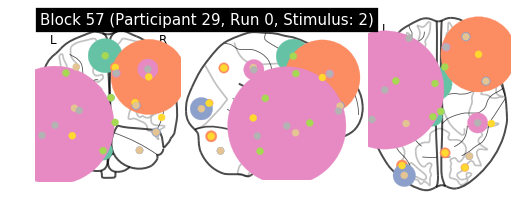

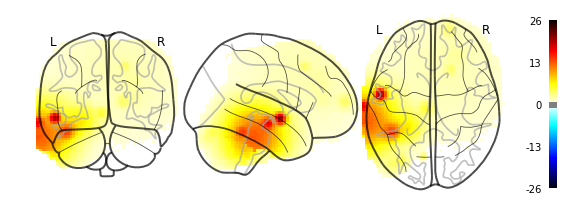

01/09/2019 20:29:10 Reconstruction Error (Frobenius Norm): 2.28211963e+03 out of 9.42772168e+03


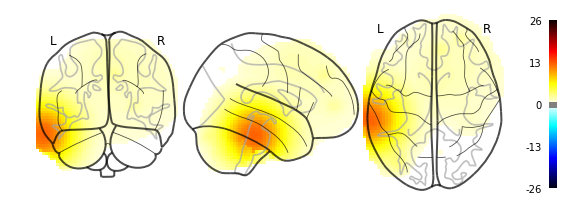

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.4829e-09, 2.2334e-09, 1.0584e-09,  ..., 4.3649e-10, 3.2460e-10,
         4.2919e-10],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.8757e-01, 4.3435e-01, 3.8173e-01,  ..., 3.6798e-08, 3.6535e-08,
         3.6159e-08]]), 'factor_centers': tensor([[  2.7328, -24.0309,  12.4789],
        [  7.1077,  22.7761, -13.5111],
        [ -5.5086, -29.5102, -43.2449],
        [ -3.2571,   5.3950,  56.7006],
        [-44.5711,   8.1600,  38.4962],
        [ 56.0273, -36.7278,  -8.2614],
        [-37.9473, -80.9529, -27.5083],
        [ 42.5047,  36.0312,  34.3143],
        [ 28.1246, -83.0653,   7.2929],
        [  7.

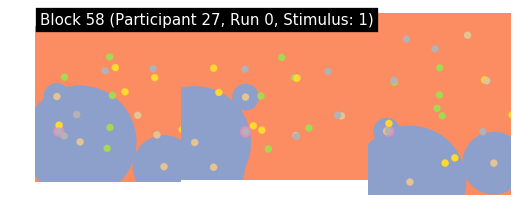

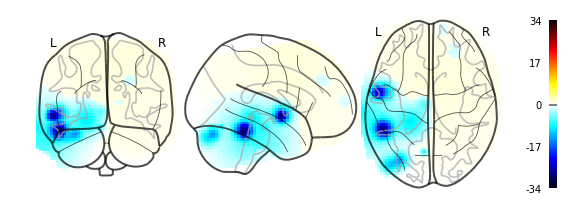

01/09/2019 20:29:38 Reconstruction Error (Frobenius Norm): 5.12136572e+03 out of 1.04150264e+04


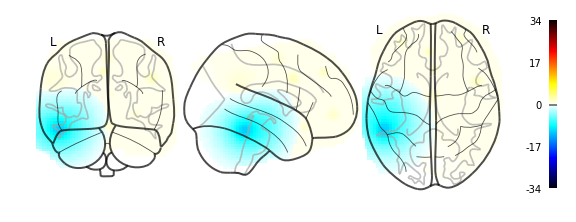

{'factors': tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6677e-31, 1.9467e-32, 1.9293e-33,  ..., 1.6885e-28, 7.2987e-29,
         2.5731e-28],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5356e-04, 1.6183e-04, 4.9902e-05,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]), 'factor_centers': tensor([[  4.3290, -28.6187,  14.8748],
        [  1.7339,  21.8924, -18.8478],
        [ -1.1961, -20.7771, -40.8746],
        [  1.3978,  -6.6948,  55.3478],
        [-46.1710,   6.7459,  34.1676],
        [ 77.8472, -27.6357, -21.0647],
        [-51.7691, -36.5893, -16.3942],
        [ 48.8048,   9.2762,  33.5865],
        [ 17.5609, -72.8472,  18.6302],
        [  7.

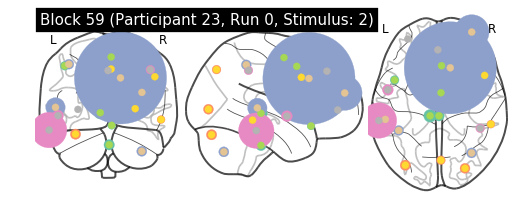

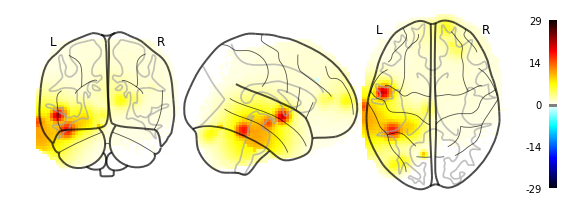

01/09/2019 20:30:05 Reconstruction Error (Frobenius Norm): 2.76611548e+03 out of 1.09408721e+04


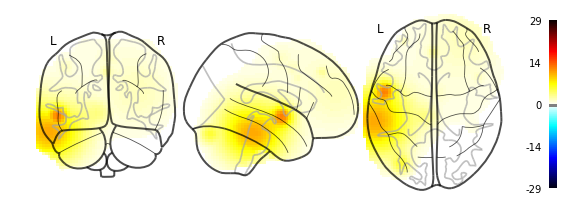

{'factors': tensor([[3.7895e-14, 3.5419e-14, 2.9572e-14,  ..., 4.9243e-24, 1.1347e-23,
         4.9039e-24],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4253e-30, 4.8736e-31, 5.8830e-32,  ..., 1.4780e-26, 7.8307e-27,
         1.4708e-26],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.2457e-01, 4.7672e-01, 4.2709e-01,  ..., 8.0607e-08, 8.2127e-08,
         7.8704e-08]]), 'factor_centers': tensor([[ -8.4424, -28.6108,  -3.2977],
        [  3.5809,  24.1115, -16.6574],
        [  0.9355, -28.5893, -37.0953],
        [  3.0173,  -4.3364,  55.2943],
        [-45.7761,   9.0651,  46.0393],
        [ 55.5263, -37.3821, -10.5284],
        [-34.5007, -80.5586, -25.8857],
        [ 48.9435,  13.9147,  34.5320],
        [ 28.2746, -83.8295,   0.9378],
        [  2.

In [10]:
for b in range(htfa.num_blocks):
    htfa.plot_factor_centers(b)
    htfa.plot_original_brain(b)
    htfa.plot_reconstruction(b)
    print(htfa.results(b))

In [11]:
def task_rest_labeler(block):
    if 'rest' in str(block.task):
        return 'Rest'
    else:
        return 'Task %s' % block.task

In [15]:
htfa.average_reconstruction_error()

01/09/2019 21:13:52 Average reconstruction Error (Frobenius Norm): 4.56580246e+03
01/09/2019 21:13:52 Average data norm (Frobenius norm): 2.27111460e+04
01/09/2019 21:13:52 Percent average reconstruction error: 20.103796
